Part 1 - Test the SAFE tool and run with the current network data

(Please see part 2 for generating the new annotation matrix based on a filter (5, 200))

In [1]:
# Test with previous annotation file (2016 version)
import sys
from os.path import expanduser

# Add path to folder containing safepy
sys.path.append(expanduser('~') + '/Downloads/Research_CB/GIN/safepy_network_annotation/safepy/')

import safe

%matplotlib inline

In [46]:
sf = safe.SAFE()
# Add the path to the input data file - test with our latest network file
input_file = expanduser('~') + '/Downloads/Research_CB/GIN/safepy_network_annotation/043_organic_GMO_circle.cys'

In [47]:
sf.load_network(network_file=input_file, node_key_attribute="gene")

Loading network from /Users/zhangxiang/Downloads/Research_CB/GIN/safepy_network_annotation/043_organic_GMO_circle.cys
Loading the cys file /Users/zhangxiang/Downloads/Research_CB/GIN/safepy_network_annotation/043_organic_GMO_circle.cys...
Loading the first view: CytoscapeSession-2021_02_26-15_59/views/8569-25697-edges_043_redundant.txt.xgmml
Loading the first network: CytoscapeSession-2021_02_26-15_59/networks/8543-edges_043_circular.xgmml
Calculating edge lengths...


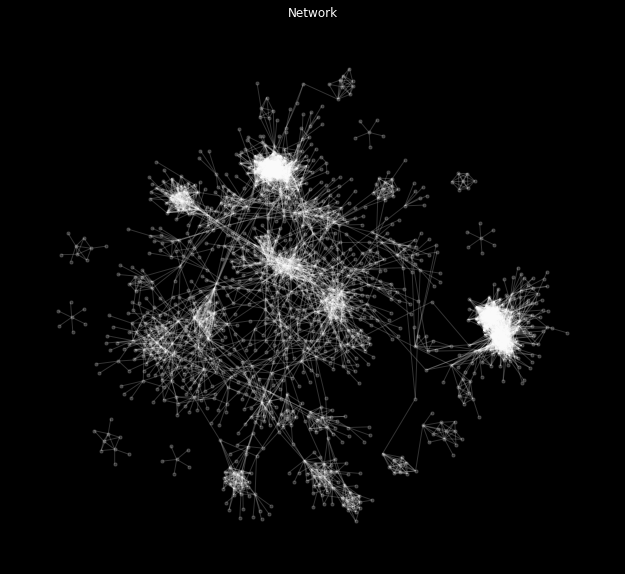

In [48]:
sf.plot_network()

In [49]:
# load attribute go_Hs_P_160509.txt (previous version)
sf.load_attributes(attribute_file='/Users/zhangxiang/Downloads/Research_CB/GIN/safepy_network_annotation/safe-data/attributes/go_Hs_P_160509.txt')

Loading attributes from /Users/zhangxiang/Downloads/Research_CB/GIN/safepy_network_annotation/safe-data/attributes/go_Hs_P_160509.txt

Attribute data provided: 17041 labels x 11040 attributes
44M2.3, A0A087WUJ7, A0A087WUV0 and 15760 other labels in the attribute file were not found in the network.

Attribute data mapped onto the network: 1278 labels x 11040 attributes
Values: 1545600 NaNs
Values: 14043453 zeros
Values: 65667 positives
Values: 0 negatives


In [50]:
sf.define_neighborhoods(node_distance_metric='euclidean', neighborhood_radius=0.05)

Node distance metric: euclidean
Neighborhood definition: 0.05 x diameter
Number of nodes per neighborhood (mean +/- std): 34.01 +/- 22.75


In [51]:
sf.compute_pvalues(multiple_testing=True)

Overwriting global settings:
	multiple_testing=True
Using the hypergeometric test to calculate enrichment...
Running FDR-adjustment of p-values...


In [52]:
sf.define_top_attributes()

Criteria for top attributes:
- minimum number of enriched neighborhoods: 10
- region-specific distribution of enriched neighborhoods as defined by: connectivity
Number of top attributes: 117


In [53]:
sf.define_domains(attribute_distance_threshold=0.65)

Number of domains: 16 (containing 1-21 attributes)


In [54]:
sf.trim_domains()

Removed 5 domains because they were the top choice for less than 10 neighborhoods.


In [57]:
# print output
import os
from pathlib import Path
output_dir = expanduser('~') + '/Downloads/Research_CB/GIN/safepy_network_annotation'
input_stem = Path(input_file).stem
output_file_dir = os.path.join(output_dir, input_stem)
if not os.path.exists(output_file_dir):
    os.makedirs(output_file_dir)

Output path: /Users/zhangxiang/Downloads/Research_CB/GIN/safepy_network_annotation/043_organic_GMO_circle_viz.pdf


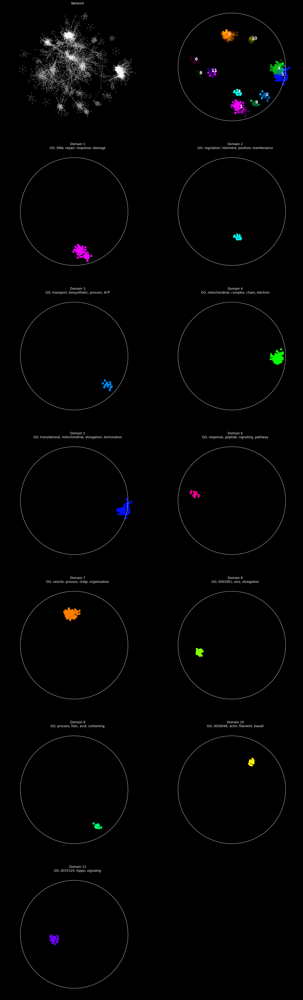

In [58]:
sf.plot_composite_network(show_each_domain=True, save_fig='{output_dir}/{input_file}_viz.pdf'.format(output_dir=output_dir, input_file=input_stem))

Output path: /Users/zhangxiang/Downloads/Research_CB/GIN/safepy_network_annotation/top_043_organic_GMO_circle_viz.pdf


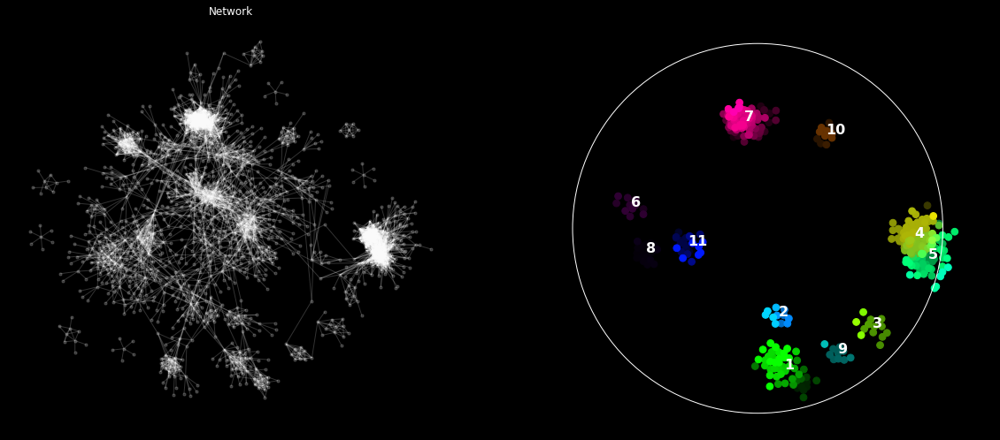

In [59]:
sf.plot_composite_network(show_each_domain=False, save_fig='{output_dir}/top_{input_file}_viz.pdf'.format(output_dir=output_dir, input_file=input_stem))

In [60]:
sf.print_output_files(output_dir=output_file_dir)

/Users/zhangxiang/Downloads/Research_CB/GIN/safepy_network_annotation/043_organic_GMO_circle/domain_properties_annotation.txt
/Users/zhangxiang/Downloads/Research_CB/GIN/safepy_network_annotation/043_organic_GMO_circle/attribute_properties_annotation.txt
/Users/zhangxiang/Downloads/Research_CB/GIN/safepy_network_annotation/043_organic_GMO_circle/node_properties_annotation.txt


In [61]:
sf.save_network(output_file=os.path.join(output_file_dir, input_stem + ".gpickle"))

Part 2 - Modify and test the make_go.py functions to generate a matrix with a filter (5, 200)

In [2]:
#!/usr/bin/env python3
# -*- coding: utf-8 -*-

from __future__ import with_statement
from collections import defaultdict
from itertools import chain

from tqdm import tqdm

import os.path
import networkx as nx
import pandas as pd
import numpy as np
import pickle
import argparse

In [27]:
# Other functions
def process_go_term(term):

    """
    In an object representing a GO term, replace single-element lists with
    their only member.
    __author__ = "Uli Köhler"
    __copyright__ = "Copyright 2013 Uli Köhler"
    __license__ = "Apache v2.0"
    __version__ = "1.1"
    :return: the modified object as a dictionary
    """

    ret = dict(term)  # Input is a defaultdict, might express unexpected behaviour
    for key, value in ret.items():
        if key != 'is_a' and len(value) == 1:
            ret[key] = value[0]
    return ret


def parse_go_obo(path_to_obo):

    """
    Parses a Gene Ontology dump in OBO v1.2 format.
    __author__ = "Uli Köhler"
    __copyright__ = "Copyright 2013 Uli Köhler"
    __license__ = "Apache v2.0"
    __version__ = "1.1"
    :param path_to_obo: Path to the OBO file containing the GO tree
    """

    with open(path_to_obo, "r") as infile:
        current_term = None

        for line in infile:

            line = line.strip()

            if not line:
                # Skip empty
                continue

            if line == "[Term]":
                if current_term:
                    yield process_go_term(current_term)
                current_term = defaultdict(list)

            elif line == "[Typedef]":
                # Skip [Typedef sections]
                current_term = None

            else:  # Not [Term]
                # Only process if we're inside a [Term] environment
                if current_term is None:
                    continue
                key, sep, val = line.partition(":")
                val_id, val_sep, val_rest = val.partition("!")
                current_term[key].append(val_id.strip())

        # Add last term
        if current_term is not None:
            yield process_go_term(current_term)


def get_go_graph(path_to_obo):

    _, ext = os.path.splitext(path_to_obo)

    # If pickle file passed, the OBO file has already been processed, just load.
    if ext == '.p':
        with open(path_to_obo, 'r') as f:
            return pd.read_pickle(path_to_obo)

    dirname_obo = os.path.dirname(path_to_obo)

    go_graph = nx.DiGraph()
    go_details = pd.DataFrame(data={'id': 'id', 'name': 'name', 'namespace': 'namespace'}, index=[0])

    # Iterate over GO terms
    term_counter = 0

    print("Parsing the OBO file (may take a few min)...")
    for go_term in parse_go_obo(path_to_obo):

        # Ignore the obsolete terms
        if go_term['name'].startswith('obsolete'):
            continue

        # Store terms details
        keys = ['id', 'name', 'namespace']
        go_term_min = dict((k, go_term[k]) for k in keys if k in go_term)
        df = pd.DataFrame(data=go_term_min, index=[0])
        go_details = go_details.append(df)

        if not go_term['id'] in go_graph.nodes():
            go_graph.add_node(go_term['id'], namespace=go_term['namespace'])

        if 'is_a' in go_term:
            for parent_term in go_term['is_a']:
                if parent_term not in go_graph.nodes():
                    go_graph.add_node(parent_term, namespace=go_term['namespace'])
                go_graph.add_edges_from([(parent_term, go_term['id'])])

        term_counter += 1

    go_details.index = go_details['id']
    go_details.drop('id', axis=0, inplace=True)

    print("Parsed %d GO terms." % term_counter)

    # Save the data
    output = {'go_graph': go_graph,
              'go_details': go_details}

    # # Save for future re-uses
    # with open(os.path.join(dirname_obo, 'go.p'), 'wb') as handle:
    #     pickle.dump(output, handle)

    return output


def get_predecessors_all(graph, nodes):

    """
    Recursively get all the predecessors of a node or a list of nodes
    :param graph: graph to be transversed
    :param nodes: a single node or a list of nodes for which the list of predecessors is required
    :return: list of predecessor nodes
    """

    if not isinstance(nodes, list):
        nodes = [nodes]

    node_predecessors = [graph.predecessors(node) for node in nodes]    # get all the immediate predecessors
    node_predecessors = list(chain.from_iterable(node_predecessors))    # flatten the list

    if not node_predecessors:   # if reached a root & no more predecessors, stop and return
        return node_predecessors
    else:   # otherwise, get the predecessors of the current list of nodes
        return node_predecessors + get_predecessors_all(graph, node_predecessors)


def store_predecessors_all(graph, node_id=None, predecessors=[]):

    """
    Recursively transverse down the whole tree (or the tree rooted at a certain term) and store each terms predecessors as a node attribute
    :param graph: the tree
    :param node_id: the starting node (if None, then the root of the tree is used as a start)
    :param predecessors: the list of predecessors for the root
    :return: the graph with node attributes stored
    """

    # If starting, start from the root
    if not node_id:
        nodes = [n for n, d in dict(graph.in_degree()).items() if d == 0]
        node_id = nodes[0]
        predecessors = []

    graph.node[node_id]['predecessors'] = predecessors
    node_successors = graph.successors(node_id)

    if node_successors:
        for node_successor in node_successors:
            graph = store_predecessors_all(graph, node_id=node_successor, predecessors=[node_id]+predecessors)

    return graph


def read_annotations(path_to_annotations):

    """
    Read the gene-to-term annotation file
    :param path_to_annotations: input filename
    :return: data frame
    """

    print("Reading the gene-to-GO term annotations...")
    go_annotations = pd.read_csv(path_to_annotations, delimiter='\t', header=None, comment="!",
                                 dtype={1: str, 10: str})
    
    # Changed by Xiang Zhang on 05/24/2021 in order to have the index as gene labels instead of protein
    #go_annotations.index = go_annotations[1]
    go_annotations.index = go_annotations[2]
    return go_annotations

In [28]:
# Split this function for better applying and debugging the filter (5, 200)
def make_locus2term_1(go_graph, go_annotations):

    print("Making the gene-to-GO term matrix...")

    go_terms = sorted(list(set(go_graph.nodes())))
    loci = sorted(list(set(go_annotations.index)))

    locus2term = np.zeros((len(loci), len(go_terms)))

    for go_term in tqdm(go_terms):

        # Get all the term's predecessors
        go_term_and_predecessors = [go_term] + go_graph.node[go_term]['predecessors']
        go_term_and_predecessors = sorted(go_term_and_predecessors)
        idx_terms = np.searchsorted(go_terms, go_term_and_predecessors)

        # Get all loci annotated to the term
        # Changed by Xiang Zhang on 05/24/2021 in order to have the loci as gene labels instead of protein
        #go_term_loci = sorted(go_annotations.loc[go_annotations[4] == go_term, 1].unique().tolist())
        go_term_loci = sorted(go_annotations.loc[go_annotations[4] == go_term, 2].unique().tolist())
        idx_loci = np.searchsorted(loci, go_term_loci)

        # Set loci x go_terms values to 1
        [r, c] = np.meshgrid(idx_loci, idx_terms)
        locus2term[r, c] = 1

    locus2term_df = pd.DataFrame(data=locus2term, index=loci, columns=go_terms)
    return locus2term_df

def make_locus2term_2(locus2term_df_full, go_graph):
    # Drop all GO terms that have 0 loci --- commented by Xiang
    #num_loci_x_term = locus2term_df.sum(axis=0)
    #locus2term_df = locus2term_df.loc[:, num_loci_x_term > 0]

    # Added by Xiang Zhang on 05/19/2021 for a filter of (5, 200)
    num_loci_x_term = locus2term_df_full.sum(axis=0)
    num_loci_x_term_5 = num_loci_x_term[num_loci_x_term > 5]
    num_loci_x_term_5_200 = num_loci_x_term_5[num_loci_x_term_5 < 200]
    locus2term_df = locus2term_df_full.loc[:, num_loci_x_term_5_200.index]

    # Find loci (if any) that have 0 terms and assign them to the root
    # Add back the root node column if dropped
    roots = [n for n, d in dict(go_graph.in_degree()).items() if d == 0]
    locus2term_df[roots[0]] = locus2term_df_full[roots[0]]
    num_terms_x_locus = locus2term_df.sum(axis=1)
    locus2term_df.loc[num_terms_x_locus == 0, roots[0]] = 1

    if locus2term_df.isnull().values.any():
        print("Null value detected")
        #locus2term_df = locus2term_df.fillna(0)

    locus2term_df = locus2term_df.astype(int)

    print('%d loci had 0 terms and were assigned to the root.' % np.sum(num_terms_x_locus == 0))

    # Transform into a sparse dataframe to save disk space and memory
    locus2term_df = locus2term_df.to_sparse(fill_value=0)

    return locus2term_df

In [29]:
# Generate the annotation matrix for BP (biological process)
path_to_obo='/Users/zhangxiang/Downloads/Research_CB/GIN/safepy_network_annotation/go-basic.obo'
path_to_annotations='/Users/zhangxiang/Downloads/Research_CB/GIN/safepy_network_annotation/goa_human.gaf'
go_branch='p'

dirname_annotations = os.path.dirname(path_to_annotations)

# Load the GO tree
go = get_go_graph(path_to_obo)
go_graph = go['go_graph']

# Load the annotations
go_annotations = read_annotations(path_to_annotations)

# Get the desired branch of GO (p, f or c)
namespaces = {'p': 'biological_process', 'c': 'cellular_component', 'f': 'molecular_function'}
nodes_branch = (n for n in go_graph if go_graph.node[n]['namespace'] == namespaces[go_branch])
go_graph_branch = go_graph.subgraph(nodes_branch)

# Store information about each terms predecessors on the tree
go_graph_branch = store_predecessors_all(go_graph_branch)

Parsing the OBO file (may take a few min)...
Parsed 43986 GO terms.
Reading the gene-to-GO term annotations...


In [30]:
# Make locus to GO term matrix - split the function
locus2term_df1 = make_locus2term_1(go_graph_branch, go_annotations)

  0%|          | 2/28641 [00:00<36:38, 13.03it/s]

Making the gene-to-GO term matrix...


100%|██████████| 28641/28641 [26:30<00:00, 18.01it/s]


In [31]:
locus2term_df1.shape

(19719, 28641)

In [32]:
# Store the temporary df1 into a file in order to save time in repeated runs since parsing takes a long time
df1_path = os.path.join(dirname_annotations, 'go_' + go_branch + '_temp_df1_5_200.txt')
locus2term_df1.to_csv(df1_path, sep='\t')

In [33]:
go_matrix = make_locus2term_2(locus2term_df1, go_graph_branch)

1770 loci had 0 terms and were assigned to the root.


In [34]:
go_matrix.shape

(19719, 5972)

In [35]:
output = {'go_matrix': go_matrix,
          'go_details': go['go_details'],
          'locus_details': go_annotations,
          'tree_path': path_to_obo,
          'annotations_path': path_to_annotations}

pickle_path = os.path.join(dirname_annotations, 'go_' + go_branch + '_5_200.p')
print("Saving the results at %s" % pickle_path)
with open(pickle_path, 'wb') as handle:
    pickle.dump(output, handle)

txt_path = os.path.join(dirname_annotations, 'go_' + go_branch + '_matrix_5_200.txt')
print("Printing the gene-to-term matrix at %s" % txt_path)
go_matrix.to_csv(txt_path, sep='\t')

Saving the results at /Users/zhangxiang/Downloads/Research_CB/GIN/safepy_network_annotation/go_p_5_200.p
Printing the gene-to-term matrix at /Users/zhangxiang/Downloads/Research_CB/GIN/safepy_network_annotation/go_p_matrix_5_200.txt


In [36]:
go_matrix

,GO:0000002,GO:0000012,GO:0000018,GO:0000027,GO:0000028,GO:0000038,GO:0000041,GO:0000045,GO:0000050,GO:0000054,...,GO:2001244,GO:2001256,GO:2001257,GO:2001258,GO:2001259,GO:2001268,GO:2001269,GO:2001280,GO:2001286,GO:0008150
A0A087WT57,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
A0A087WUV0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
A0A087WVE0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
A0A087WW49,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
A0A087WWC5,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
A0A087WZV9,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
A0A087X0B3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
A0A087X1B8,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
A0A096LPH7,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
A0A096LPI6,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1


In [37]:
# Generate the annotation matrix for CC (cellular component)
path_to_obo='/Users/zhangxiang/Downloads/Research_CB/GIN/safepy_network_annotation/go-basic.obo'
path_to_annotations='/Users/zhangxiang/Downloads/Research_CB/GIN/safepy_network_annotation/goa_human.gaf'
go_branch='c'

dirname_annotations = os.path.dirname(path_to_annotations)

# Load the GO tree
go = get_go_graph(path_to_obo)
go_graph = go['go_graph']

# Load the annotations
go_annotations = read_annotations(path_to_annotations)

# Get the desired branch of GO (p, f or c)
namespaces = {'p': 'biological_process', 'c': 'cellular_component', 'f': 'molecular_function'}
nodes_branch = (n for n in go_graph if go_graph.node[n]['namespace'] == namespaces[go_branch])
go_graph_branch = go_graph.subgraph(nodes_branch)

# Store information about each terms predecessors on the tree
go_graph_branch = store_predecessors_all(go_graph_branch)

Parsing the OBO file (may take a few min)...
Parsed 43986 GO terms.
Reading the gene-to-GO term annotations...


In [38]:
# Make locus to GO term matrix - split the function
locus2term_df1_cc = make_locus2term_1(go_graph_branch, go_annotations)

  0%|          | 2/4176 [00:00<04:46, 14.58it/s]

Making the gene-to-GO term matrix...


100%|██████████| 4176/4176 [03:19<00:00, 20.91it/s]


In [39]:
go_matrix_cc = make_locus2term_2(locus2term_df1_cc, go_graph_branch)

812 loci had 0 terms and were assigned to the root.


In [40]:
go_matrix_cc.shape

(19719, 874)

In [41]:
output = {'go_matrix': go_matrix_cc,
          'go_details': go['go_details'],
          'locus_details': go_annotations,
          'tree_path': path_to_obo,
          'annotations_path': path_to_annotations}

pickle_path = os.path.join(dirname_annotations, 'go_' + go_branch + '_5_200.p')
print("Saving the results at %s" % pickle_path)
with open(pickle_path, 'wb') as handle:
    pickle.dump(output, handle)

txt_path = os.path.join(dirname_annotations, 'go_' + go_branch + '_matrix_5_200.txt')
print("Printing the gene-to-term matrix at %s" % txt_path)
go_matrix_cc.to_csv(txt_path, sep='\t')

Saving the results at /Users/zhangxiang/Downloads/Research_CB/GIN/safepy_network_annotation/go_c_5_200.p
Printing the gene-to-term matrix at /Users/zhangxiang/Downloads/Research_CB/GIN/safepy_network_annotation/go_c_matrix_5_200.txt


In [42]:
go_matrix_cc

,GO:0000109,GO:0000118,GO:0000123,GO:0000124,GO:0000127,GO:0000137,GO:0000138,GO:0000145,GO:0000152,GO:0000153,...,GO:1990498,GO:1990531,GO:1990635,GO:1990712,GO:1990752,GO:1990777,GO:1990907,GO:1990909,GO:1990913,GO:0005575
A0A087WT57,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
A0A087WUV0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
A0A087WVE0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
A0A087WW49,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
A0A087WWC5,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
A0A087WZV9,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
A0A087X0B3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
A0A087X1B8,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
A0A096LPH7,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
A0A096LPI6,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1


Part 3 - Apply the updated annotations matrices to the current networks for BP & CC

In [45]:
# Generate outputs for CC
import sys
from os.path import expanduser

# Add path to folder containing safepy
sys.path.append(expanduser('~') + '/Downloads/Research_CB/GIN/safepy_network_annotation/safepy/')

import safe

%matplotlib inline

In [46]:
sf = safe.SAFE()
# Add the path to the input data file - test with our latest network file
input_file = expanduser('~') + '/Downloads/Research_CB/GIN/safepy_network_annotation/043_organic_GMO_circle.cys'

In [47]:
sf.load_network(network_file=input_file, node_key_attribute="gene")

Loading network from /Users/zhangxiang/Downloads/Research_CB/GIN/safepy_network_annotation/043_organic_GMO_circle.cys
Loading the cys file /Users/zhangxiang/Downloads/Research_CB/GIN/safepy_network_annotation/043_organic_GMO_circle.cys...
Loading the first view: CytoscapeSession-2021_02_26-15_59/views/8569-25697-edges_043_redundant.txt.xgmml
Loading the first network: CytoscapeSession-2021_02_26-15_59/networks/8543-edges_043_circular.xgmml
Calculating edge lengths...


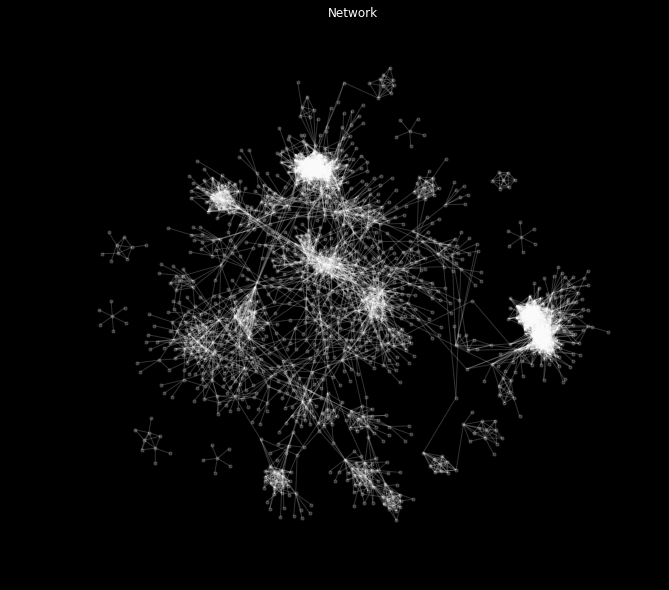

In [48]:
sf.plot_network()

In [49]:
# load attribute with go_p_matrix_5_200.txt --- BP
sf.load_attributes(attribute_file='/Users/zhangxiang/Downloads/Research_CB/GIN/safepy_network_annotation/safe_go_matrix_output/GO_BP_5_200/go_p_matrix_5_200.txt')

Loading attributes from /Users/zhangxiang/Downloads/Research_CB/GIN/safepy_network_annotation/safe_go_matrix_output/GO_BP_5_200/go_p_matrix_5_200.txt

Attribute data provided: 19719 labels x 5972 attributes
A0A087WT57, A0A087WUV0, A0A087WVE0 and 18415 other labels in the attribute file were not found in the network.

Attribute data mapped onto the network: 1301 labels x 5972 attributes
Values: 698724 NaNs
Values: 7752551 zeros
Values: 17021 positives
Values: 0 negatives


In [50]:
sf.define_neighborhoods(node_distance_metric='euclidean', neighborhood_radius=0.05)

Node distance metric: euclidean
Neighborhood definition: 0.05 x diameter
Number of nodes per neighborhood (mean +/- std): 34.01 +/- 22.75


In [51]:
sf.compute_pvalues(multiple_testing=True)

Overwriting global settings:
	multiple_testing=True
Using the hypergeometric test to calculate enrichment...
Running FDR-adjustment of p-values...


In [52]:
sf.define_top_attributes()

Criteria for top attributes:
- minimum number of enriched neighborhoods: 10
- region-specific distribution of enriched neighborhoods as defined by: connectivity
Number of top attributes: 70


In [53]:
sf.define_domains(attribute_distance_threshold=0.65)

Number of domains: 14 (containing 1-10 attributes)


In [54]:
sf.trim_domains()

Removed 3 domains because they were the top choice for less than 10 neighborhoods.


In [55]:
# print output
import os
from pathlib import Path
output_dir = expanduser('~') + '/Downloads/Research_CB/GIN/safepy_network_annotation/043_organic_GMO_circle_updated'
input_stem = Path(input_file).stem
output_file_dir = os.path.join(output_dir, input_stem)
if not os.path.exists(output_file_dir):
    os.makedirs(output_file_dir)

Output path: /Users/zhangxiang/Downloads/Research_CB/GIN/safepy_network_annotation/043_organic_GMO_circle_updated/043_organic_GMO_circle_viz.pdf


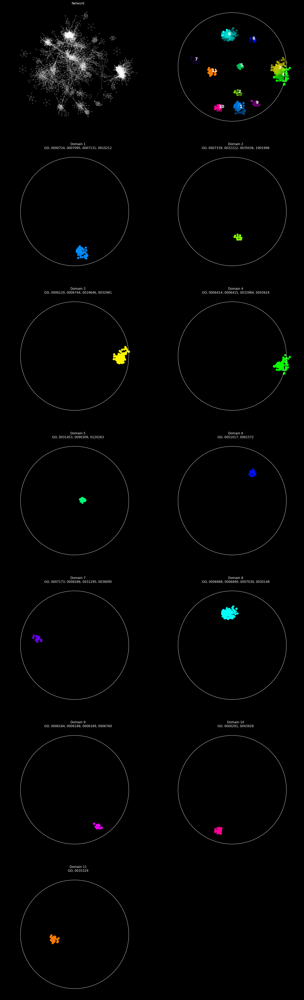

In [56]:
sf.plot_composite_network(show_each_domain=True, save_fig='{output_dir}/{input_file}_viz.pdf'.format(output_dir=output_dir, input_file=input_stem))

Output path: /Users/zhangxiang/Downloads/Research_CB/GIN/safepy_network_annotation/043_organic_GMO_circle_updated/top_043_organic_GMO_circle_viz.pdf


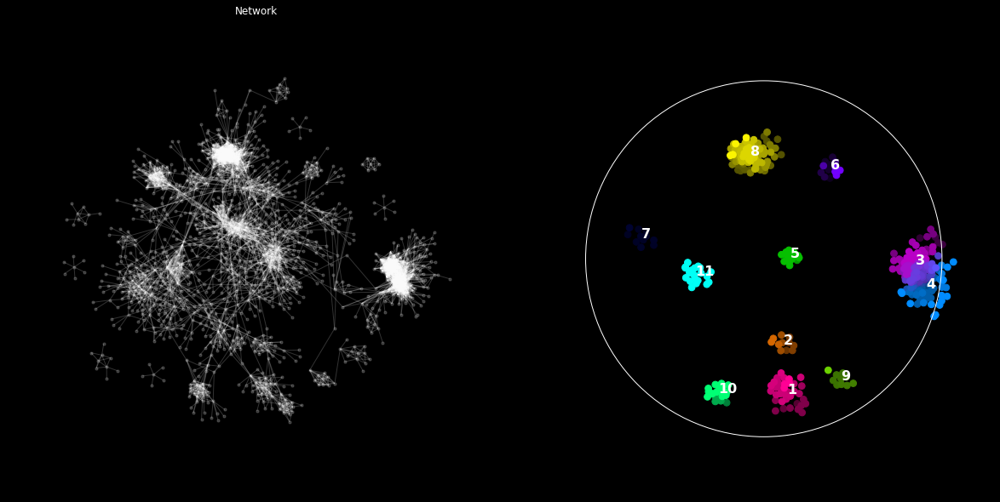

In [57]:
sf.plot_composite_network(show_each_domain=False, save_fig='{output_dir}/top_{input_file}_viz.pdf'.format(output_dir=output_dir, input_file=input_stem))

In [58]:
sf.print_output_files(output_dir=output_file_dir)

/Users/zhangxiang/Downloads/Research_CB/GIN/safepy_network_annotation/043_organic_GMO_circle_updated/043_organic_GMO_circle/domain_properties_annotation.txt
/Users/zhangxiang/Downloads/Research_CB/GIN/safepy_network_annotation/043_organic_GMO_circle_updated/043_organic_GMO_circle/attribute_properties_annotation.txt
/Users/zhangxiang/Downloads/Research_CB/GIN/safepy_network_annotation/043_organic_GMO_circle_updated/043_organic_GMO_circle/node_properties_annotation.txt


In [59]:
sf.save_network(output_file=os.path.join(output_file_dir, input_stem + ".gpickle"))

In [60]:
# Generate outputs for CC
import sys
from os.path import expanduser

# Add path to folder containing safepy
sys.path.append(expanduser('~') + '/Downloads/Research_CB/GIN/safepy_network_annotation/safepy/')

import safe

%matplotlib inline

In [61]:
sf = safe.SAFE()
# Add the path to the input data file - test with our latest network file
input_file = expanduser('~') + '/Downloads/Research_CB/GIN/safepy_network_annotation/043_organic_GMO_circle.cys'

In [62]:
sf.load_network(network_file=input_file, node_key_attribute="gene")

Loading network from /Users/zhangxiang/Downloads/Research_CB/GIN/safepy_network_annotation/043_organic_GMO_circle.cys
Loading the cys file /Users/zhangxiang/Downloads/Research_CB/GIN/safepy_network_annotation/043_organic_GMO_circle.cys...
Loading the first view: CytoscapeSession-2021_02_26-15_59/views/8569-25697-edges_043_redundant.txt.xgmml
Loading the first network: CytoscapeSession-2021_02_26-15_59/networks/8543-edges_043_circular.xgmml
Calculating edge lengths...


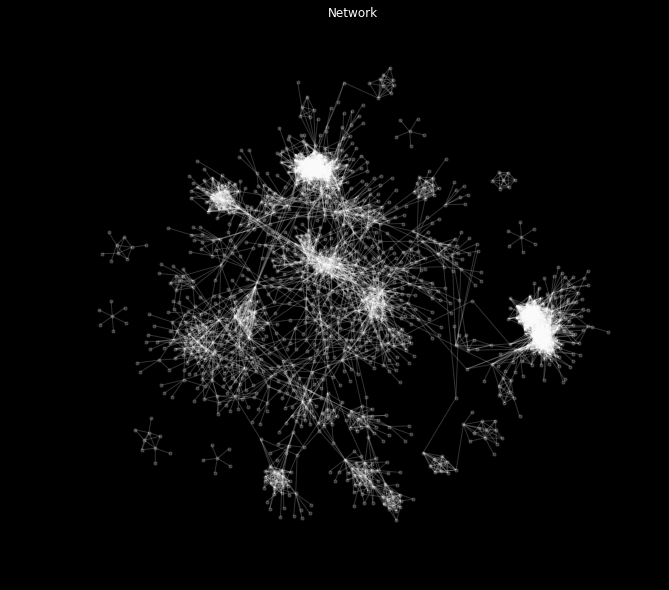

In [63]:
sf.plot_network()

In [64]:
# load attribute with go_c_matrix_5_200.txt --- CC
sf.load_attributes(attribute_file='/Users/zhangxiang/Downloads/Research_CB/GIN/safepy_network_annotation/safe_go_matrix_output/GO_CC_5_200/go_c_matrix_5_200.txt')

Loading attributes from /Users/zhangxiang/Downloads/Research_CB/GIN/safepy_network_annotation/safe_go_matrix_output/GO_CC_5_200/go_c_matrix_5_200.txt

Attribute data provided: 19719 labels x 874 attributes
A0A087WT57, A0A087WUV0, A0A087WVE0 and 18415 other labels in the attribute file were not found in the network.

Attribute data mapped onto the network: 1301 labels x 874 attributes
Values: 102258 NaNs
Values: 1132742 zeros
Values: 4332 positives
Values: 0 negatives


In [65]:
sf.define_neighborhoods(node_distance_metric='euclidean', neighborhood_radius=0.05)

Node distance metric: euclidean
Neighborhood definition: 0.05 x diameter
Number of nodes per neighborhood (mean +/- std): 34.01 +/- 22.75


In [66]:
sf.compute_pvalues(multiple_testing=True)

Overwriting global settings:
	multiple_testing=True
Using the hypergeometric test to calculate enrichment...
Running FDR-adjustment of p-values...


In [67]:
sf.define_top_attributes()

Criteria for top attributes:
- minimum number of enriched neighborhoods: 10
- region-specific distribution of enriched neighborhoods as defined by: connectivity
Number of top attributes: 34


In [68]:
sf.define_domains(attribute_distance_threshold=0.65)

Number of domains: 9 (containing 1-9 attributes)


In [69]:
sf.trim_domains()

Removed 1 domains because they were the top choice for less than 10 neighborhoods.


In [70]:
# print output
import os
from pathlib import Path
output_dir = expanduser('~') + '/Downloads/Research_CB/GIN/safepy_network_annotation/043_organic_GMO_circle_updated_CC'
input_stem = Path(input_file).stem
output_file_dir = os.path.join(output_dir, input_stem)
if not os.path.exists(output_file_dir):
    os.makedirs(output_file_dir)

Output path: /Users/zhangxiang/Downloads/Research_CB/GIN/safepy_network_annotation/043_organic_GMO_circle_updated_CC/043_organic_GMO_circle_viz.pdf


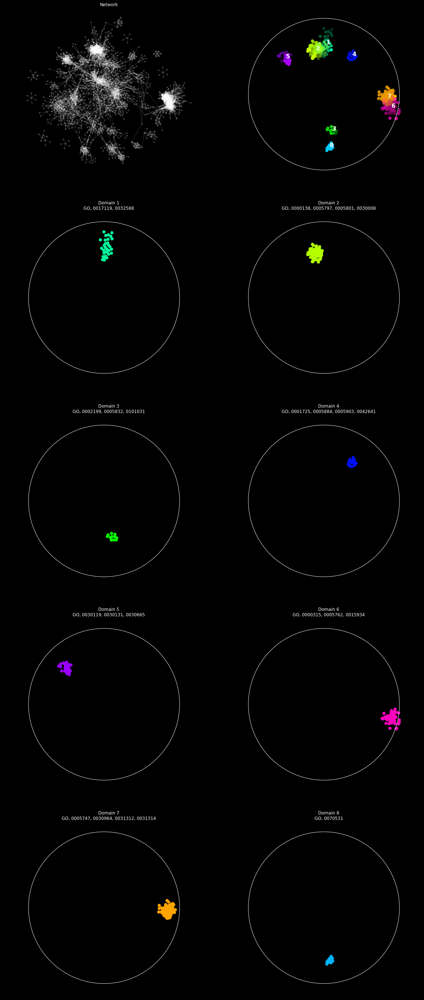

In [71]:
sf.plot_composite_network(show_each_domain=True, save_fig='{output_dir}/{input_file}_viz.pdf'.format(output_dir=output_dir, input_file=input_stem))

Output path: /Users/zhangxiang/Downloads/Research_CB/GIN/safepy_network_annotation/043_organic_GMO_circle_updated_CC/top_043_organic_GMO_circle_viz.pdf


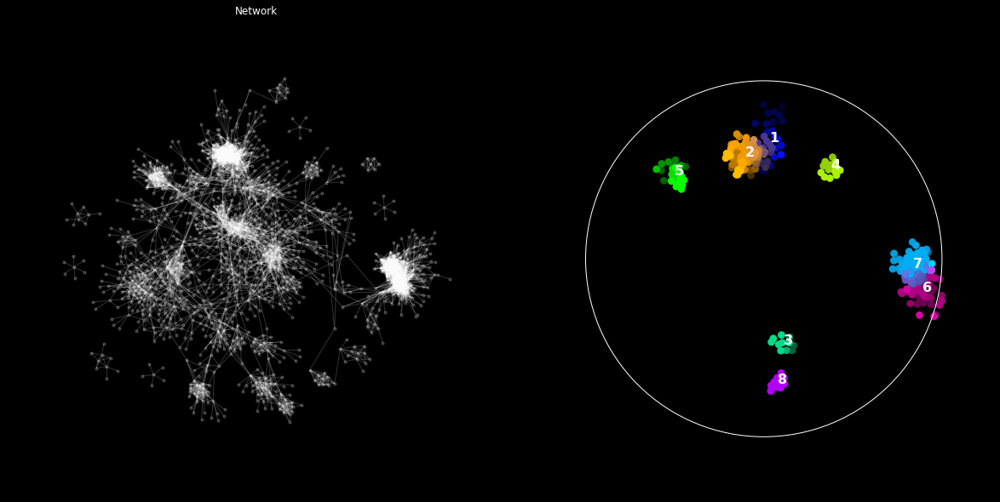

In [72]:
sf.plot_composite_network(show_each_domain=False, save_fig='{output_dir}/top_{input_file}_viz.pdf'.format(output_dir=output_dir, input_file=input_stem))

In [73]:
sf.print_output_files(output_dir=output_file_dir)

/Users/zhangxiang/Downloads/Research_CB/GIN/safepy_network_annotation/043_organic_GMO_circle_updated_CC/043_organic_GMO_circle/domain_properties_annotation.txt
/Users/zhangxiang/Downloads/Research_CB/GIN/safepy_network_annotation/043_organic_GMO_circle_updated_CC/043_organic_GMO_circle/attribute_properties_annotation.txt
/Users/zhangxiang/Downloads/Research_CB/GIN/safepy_network_annotation/043_organic_GMO_circle_updated_CC/043_organic_GMO_circle/node_properties_annotation.txt


In [74]:
sf.save_network(output_file=os.path.join(output_file_dir, input_stem + ".gpickle"))

Part 4 - make a new version of the CC annotation file with the bounds of (100,18000)

In [1]:
#!/usr/bin/env python3
# -*- coding: utf-8 -*-

from __future__ import with_statement
from collections import defaultdict
from itertools import chain

from tqdm import tqdm

import os.path
import networkx as nx
import pandas as pd
import numpy as np
import pickle
import argparse

In [2]:
# Other functions
def process_go_term(term):

    """
    In an object representing a GO term, replace single-element lists with
    their only member.
    __author__ = "Uli Köhler"
    __copyright__ = "Copyright 2013 Uli Köhler"
    __license__ = "Apache v2.0"
    __version__ = "1.1"
    :return: the modified object as a dictionary
    """

    ret = dict(term)  # Input is a defaultdict, might express unexpected behaviour
    for key, value in ret.items():
        if key != 'is_a' and len(value) == 1:
            ret[key] = value[0]
    return ret


def parse_go_obo(path_to_obo):

    """
    Parses a Gene Ontology dump in OBO v1.2 format.
    __author__ = "Uli Köhler"
    __copyright__ = "Copyright 2013 Uli Köhler"
    __license__ = "Apache v2.0"
    __version__ = "1.1"
    :param path_to_obo: Path to the OBO file containing the GO tree
    """

    with open(path_to_obo, "r") as infile:
        current_term = None

        for line in infile:

            line = line.strip()

            if not line:
                # Skip empty
                continue

            if line == "[Term]":
                if current_term:
                    yield process_go_term(current_term)
                current_term = defaultdict(list)

            elif line == "[Typedef]":
                # Skip [Typedef sections]
                current_term = None

            else:  # Not [Term]
                # Only process if we're inside a [Term] environment
                if current_term is None:
                    continue
                key, sep, val = line.partition(":")
                val_id, val_sep, val_rest = val.partition("!")
                current_term[key].append(val_id.strip())

        # Add last term
        if current_term is not None:
            yield process_go_term(current_term)


def get_go_graph(path_to_obo):

    _, ext = os.path.splitext(path_to_obo)

    # If pickle file passed, the OBO file has already been processed, just load.
    if ext == '.p':
        with open(path_to_obo, 'r') as f:
            return pd.read_pickle(path_to_obo)

    dirname_obo = os.path.dirname(path_to_obo)

    go_graph = nx.DiGraph()
    go_details = pd.DataFrame(data={'id': 'id', 'name': 'name', 'namespace': 'namespace'}, index=[0])

    # Iterate over GO terms
    term_counter = 0

    print("Parsing the OBO file (may take a few min)...")
    for go_term in parse_go_obo(path_to_obo):

        # Ignore the obsolete terms
        if go_term['name'].startswith('obsolete'):
            continue

        # Store terms details
        keys = ['id', 'name', 'namespace']
        go_term_min = dict((k, go_term[k]) for k in keys if k in go_term)
        df = pd.DataFrame(data=go_term_min, index=[0])
        go_details = go_details.append(df)

        if not go_term['id'] in go_graph.nodes():
            go_graph.add_node(go_term['id'], namespace=go_term['namespace'])

        if 'is_a' in go_term:
            for parent_term in go_term['is_a']:
                if parent_term not in go_graph.nodes():
                    go_graph.add_node(parent_term, namespace=go_term['namespace'])
                go_graph.add_edges_from([(parent_term, go_term['id'])])

        term_counter += 1

    go_details.index = go_details['id']
    go_details.drop('id', axis=0, inplace=True)

    print("Parsed %d GO terms." % term_counter)

    # Save the data
    output = {'go_graph': go_graph,
              'go_details': go_details}

    # # Save for future re-uses
    # with open(os.path.join(dirname_obo, 'go.p'), 'wb') as handle:
    #     pickle.dump(output, handle)

    return output


def get_predecessors_all(graph, nodes):

    """
    Recursively get all the predecessors of a node or a list of nodes
    :param graph: graph to be transversed
    :param nodes: a single node or a list of nodes for which the list of predecessors is required
    :return: list of predecessor nodes
    """

    if not isinstance(nodes, list):
        nodes = [nodes]

    node_predecessors = [graph.predecessors(node) for node in nodes]    # get all the immediate predecessors
    node_predecessors = list(chain.from_iterable(node_predecessors))    # flatten the list

    if not node_predecessors:   # if reached a root & no more predecessors, stop and return
        return node_predecessors
    else:   # otherwise, get the predecessors of the current list of nodes
        return node_predecessors + get_predecessors_all(graph, node_predecessors)


def store_predecessors_all(graph, node_id=None, predecessors=[]):

    """
    Recursively transverse down the whole tree (or the tree rooted at a certain term) and store each terms predecessors as a node attribute
    :param graph: the tree
    :param node_id: the starting node (if None, then the root of the tree is used as a start)
    :param predecessors: the list of predecessors for the root
    :return: the graph with node attributes stored
    """

    # If starting, start from the root
    if not node_id:
        nodes = [n for n, d in dict(graph.in_degree()).items() if d == 0]
        node_id = nodes[0]
        predecessors = []

    graph.node[node_id]['predecessors'] = predecessors
    node_successors = graph.successors(node_id)

    if node_successors:
        for node_successor in node_successors:
            graph = store_predecessors_all(graph, node_id=node_successor, predecessors=[node_id]+predecessors)

    return graph


def read_annotations(path_to_annotations):

    """
    Read the gene-to-term annotation file
    :param path_to_annotations: input filename
    :return: data frame
    """

    print("Reading the gene-to-GO term annotations...")
    go_annotations = pd.read_csv(path_to_annotations, delimiter='\t', header=None, comment="!",
                                 dtype={1: str, 10: str})
    
    # Changed by Xiang Zhang on 05/24/2021 in order to have the index as gene labels instead of protein
    #go_annotations.index = go_annotations[1]
    go_annotations.index = go_annotations[2]
    return go_annotations

In [3]:
# Split this function for better applying and debugging the filter (100, 18000)
def make_locus2term_1(go_graph, go_annotations):

    print("Making the gene-to-GO term matrix...")

    go_terms = sorted(list(set(go_graph.nodes())))
    loci = sorted(list(set(go_annotations.index)))

    locus2term = np.zeros((len(loci), len(go_terms)))

    for go_term in tqdm(go_terms):

        # Get all the term's predecessors
        go_term_and_predecessors = [go_term] + go_graph.node[go_term]['predecessors']
        go_term_and_predecessors = sorted(go_term_and_predecessors)
        idx_terms = np.searchsorted(go_terms, go_term_and_predecessors)

        # Get all loci annotated to the term
        # Changed by Xiang Zhang on 05/24/2021 in order to have the loci as gene labels instead of protein
        #go_term_loci = sorted(go_annotations.loc[go_annotations[4] == go_term, 1].unique().tolist())
        go_term_loci = sorted(go_annotations.loc[go_annotations[4] == go_term, 2].unique().tolist())
        idx_loci = np.searchsorted(loci, go_term_loci)

        # Set loci x go_terms values to 1
        [r, c] = np.meshgrid(idx_loci, idx_terms)
        locus2term[r, c] = 1

    locus2term_df = pd.DataFrame(data=locus2term, index=loci, columns=go_terms)
    return locus2term_df

def make_locus2term_2(locus2term_df_full, go_graph):
    # Drop all GO terms that have 0 loci --- commented by Xiang
    #num_loci_x_term = locus2term_df.sum(axis=0)
    #locus2term_df = locus2term_df.loc[:, num_loci_x_term > 0]

    # Added by Xiang Zhang on 05/19/2021 for a filter of (100, 18000)
    num_loci_x_term = locus2term_df_full.sum(axis=0)
    num_loci_x_term_100 = num_loci_x_term[num_loci_x_term > 100]
    num_loci_x_term_100_18000 = num_loci_x_term_100[num_loci_x_term_100 < 18000]
    locus2term_df = locus2term_df_full.loc[:, num_loci_x_term_100_18000.index]

    # Find loci (if any) that have 0 terms and assign them to the root
    # Add back the root node column if dropped
    roots = [n for n, d in dict(go_graph.in_degree()).items() if d == 0]
    locus2term_df[roots[0]] = locus2term_df_full[roots[0]]
    num_terms_x_locus = locus2term_df.sum(axis=1)
    locus2term_df.loc[num_terms_x_locus == 0, roots[0]] = 1

    if locus2term_df.isnull().values.any():
        print("Null value detected")
        #locus2term_df = locus2term_df.fillna(0)

    locus2term_df = locus2term_df.astype(int)

    print('%d loci had 0 terms and were assigned to the root.' % np.sum(num_terms_x_locus == 0))

    # Transform into a sparse dataframe to save disk space and memory
    locus2term_df = locus2term_df.to_sparse(fill_value=0)

    return locus2term_df

In [4]:
# Generate the annotation matrix for CC (cellular component)
path_to_obo='/Users/zhangxiang/Downloads/Research_CB/GIN/safepy_network_annotation/go-basic.obo'
path_to_annotations='/Users/zhangxiang/Downloads/Research_CB/GIN/safepy_network_annotation/goa_human.gaf'
go_branch='c'

dirname_annotations = os.path.dirname(path_to_annotations)

# Load the GO tree
go = get_go_graph(path_to_obo)
go_graph = go['go_graph']

# Load the annotations
go_annotations = read_annotations(path_to_annotations)

# Get the desired branch of GO (p, f or c)
namespaces = {'p': 'biological_process', 'c': 'cellular_component', 'f': 'molecular_function'}
nodes_branch = (n for n in go_graph if go_graph.node[n]['namespace'] == namespaces[go_branch])
go_graph_branch = go_graph.subgraph(nodes_branch)

# Store information about each terms predecessors on the tree
go_graph_branch = store_predecessors_all(go_graph_branch)

Parsing the OBO file (may take a few min)...
Parsed 43986 GO terms.
Reading the gene-to-GO term annotations...


/Users/zhangxiang/opt/anaconda3/envs/safe_env2/lib/python3.6/site-packages/IPython/core/interactiveshell.py:3263: DtypeWarning: Columns (15) have mixed types. Specify dtype option on import or set low_memory=False.
  if (await self.run_code(code, result,  async_=asy)):


In [5]:
# Make locus to GO term matrix - split the function
locus2term_df1_cc = make_locus2term_1(go_graph_branch, go_annotations)

  0%|          | 1/4176 [00:00<07:04,  9.84it/s]

Making the gene-to-GO term matrix...


100%|██████████| 4176/4176 [03:34<00:00, 19.49it/s]


In [6]:
go_matrix_cc = make_locus2term_2(locus2term_df1_cc, go_graph_branch)

812 loci had 0 terms and were assigned to the root.


In [7]:
go_matrix_cc.shape

(19719, 199)

In [8]:
output = {'go_matrix': go_matrix_cc,
          'go_details': go['go_details'],
          'locus_details': go_annotations,
          'tree_path': path_to_obo,
          'annotations_path': path_to_annotations}

pickle_path = os.path.join(dirname_annotations, 'go_' + go_branch + '_100_18000.p')
print("Saving the results at %s" % pickle_path)
with open(pickle_path, 'wb') as handle:
    pickle.dump(output, handle)

txt_path = os.path.join(dirname_annotations, 'go_' + go_branch + '_matrix_100_18000.txt')
print("Printing the gene-to-term matrix at %s" % txt_path)
go_matrix_cc.to_csv(txt_path, sep='\t')

Saving the results at /Users/zhangxiang/Downloads/Research_CB/GIN/safepy_network_annotation/go_c_100_18000.p
Printing the gene-to-term matrix at /Users/zhangxiang/Downloads/Research_CB/GIN/safepy_network_annotation/go_c_matrix_100_18000.txt


In [9]:
go_matrix_cc

,GO:0000139,GO:0000151,GO:0000323,GO:0000776,GO:0000781,GO:0000785,GO:0000922,GO:0001650,GO:0005576,GO:0005615,...,GO:0140535,GO:1902494,GO:1902495,GO:1903561,GO:1904813,GO:1990204,GO:1990234,GO:1990351,GO:1990904,GO:0005575
A0A087WT57,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
A0A087WUV0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
A0A087WVE0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
A0A087WW49,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
A0A087WWC5,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
A0A087WZV9,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
A0A087X0B3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
A0A087X1B8,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
A0A096LPH7,0,0,0,0,0,0,0,0,0,0,...,1,0,0,0,0,0,0,0,0,1
A0A096LPI6,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1


In [10]:
# Generate outputs for CC
import sys
from os.path import expanduser

# Add path to folder containing safepy
sys.path.append(expanduser('~') + '/Downloads/Research_CB/GIN/safepy_network_annotation/safepy/')

import safe

%matplotlib inline

In [11]:
sf = safe.SAFE()
# Add the path to the input data file - test with our latest network file
input_file = expanduser('~') + '/Downloads/Research_CB/GIN/safepy_network_annotation/043_organic_GMO_circle.cys'

In [12]:
sf.load_network(network_file=input_file, node_key_attribute="gene")

Loading network from /Users/zhangxiang/Downloads/Research_CB/GIN/safepy_network_annotation/043_organic_GMO_circle.cys
Loading the cys file /Users/zhangxiang/Downloads/Research_CB/GIN/safepy_network_annotation/043_organic_GMO_circle.cys...
Loading the first view: CytoscapeSession-2021_02_26-15_59/views/8569-25697-edges_043_redundant.txt.xgmml
Loading the first network: CytoscapeSession-2021_02_26-15_59/networks/8543-edges_043_circular.xgmml
Calculating edge lengths...


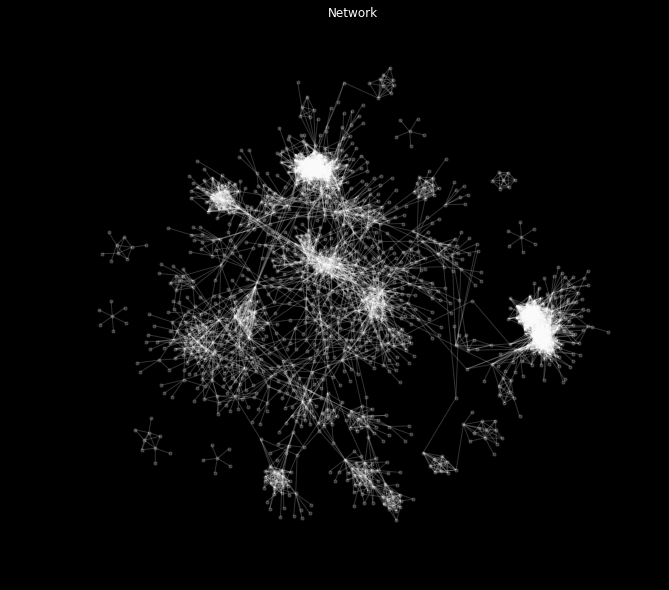

In [13]:
sf.plot_network()

In [14]:
# load attribute with go_c_matrix_100_18000.txt --- CC
sf.load_attributes(attribute_file='/Users/zhangxiang/Downloads/Research_CB/GIN/safepy_network_annotation/safe_go_matrix_output/GO_CC_100_18000/go_c_matrix_100_18000.txt')

Loading attributes from /Users/zhangxiang/Downloads/Research_CB/GIN/safepy_network_annotation/safe_go_matrix_output/GO_CC_100_18000/go_c_matrix_100_18000.txt

Attribute data provided: 19719 labels x 199 attributes
A0A087WT57, A0A087WUV0, A0A087WVE0 and 18415 other labels in the attribute file were not found in the network.

Attribute data mapped onto the network: 1301 labels x 199 attributes
Values: 23283 NaNs
Values: 243669 zeros
Values: 15230 positives
Values: 0 negatives


In [15]:
sf.define_neighborhoods(node_distance_metric='euclidean', neighborhood_radius=0.05)

Node distance metric: euclidean
Neighborhood definition: 0.05 x diameter
Number of nodes per neighborhood (mean +/- std): 34.01 +/- 22.75


In [16]:
sf.compute_pvalues(multiple_testing=True)

Overwriting global settings:
	multiple_testing=True
Using the hypergeometric test to calculate enrichment...
Running FDR-adjustment of p-values...


In [17]:
sf.define_top_attributes()

Criteria for top attributes:
- minimum number of enriched neighborhoods: 10
- region-specific distribution of enriched neighborhoods as defined by: connectivity
Number of top attributes: 5


In [18]:
sf.define_domains(attribute_distance_threshold=0.65)

Number of domains: 3 (containing 1-2 attributes)


In [19]:
sf.trim_domains()

Removed 0 domains because they were the top choice for less than 10 neighborhoods.


In [20]:
# print output
import os
from pathlib import Path
output_dir = expanduser('~') + '/Downloads/Research_CB/GIN/safepy_network_annotation/043_organic_GMO_circle_updated_CC_100_18000'
input_stem = Path(input_file).stem
output_file_dir = os.path.join(output_dir, input_stem)
if not os.path.exists(output_file_dir):
    os.makedirs(output_file_dir)

Output path: /Users/zhangxiang/Downloads/Research_CB/GIN/safepy_network_annotation/043_organic_GMO_circle_updated_CC_100_18000/043_organic_GMO_circle_viz.pdf


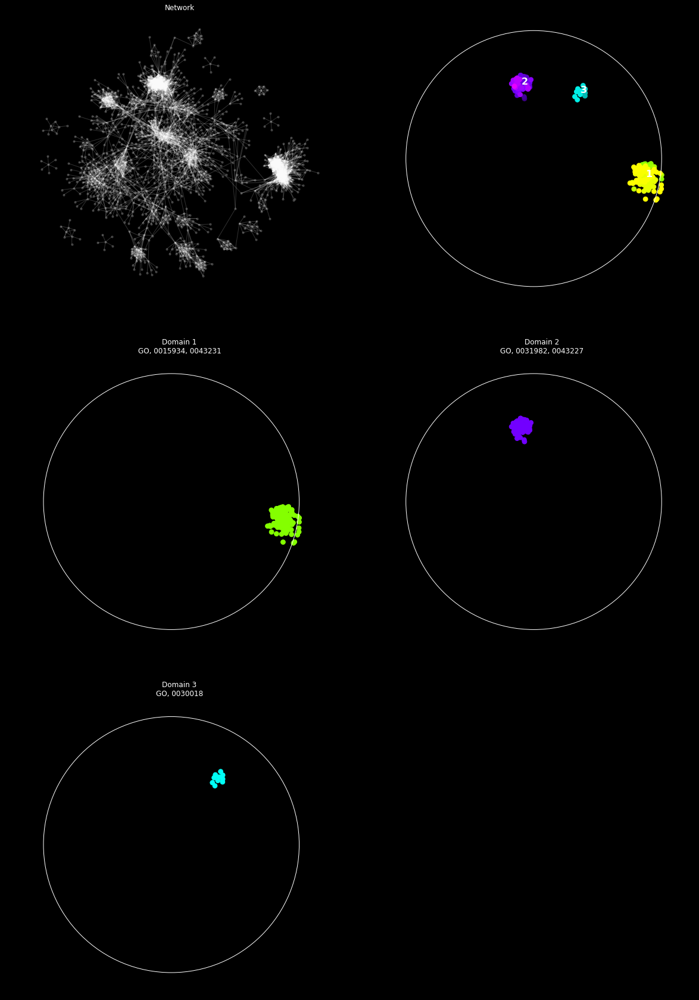

In [21]:
sf.plot_composite_network(show_each_domain=True, save_fig='{output_dir}/{input_file}_viz.pdf'.format(output_dir=output_dir, input_file=input_stem))

Output path: /Users/zhangxiang/Downloads/Research_CB/GIN/safepy_network_annotation/043_organic_GMO_circle_updated_CC_100_18000/top_043_organic_GMO_circle_viz.pdf


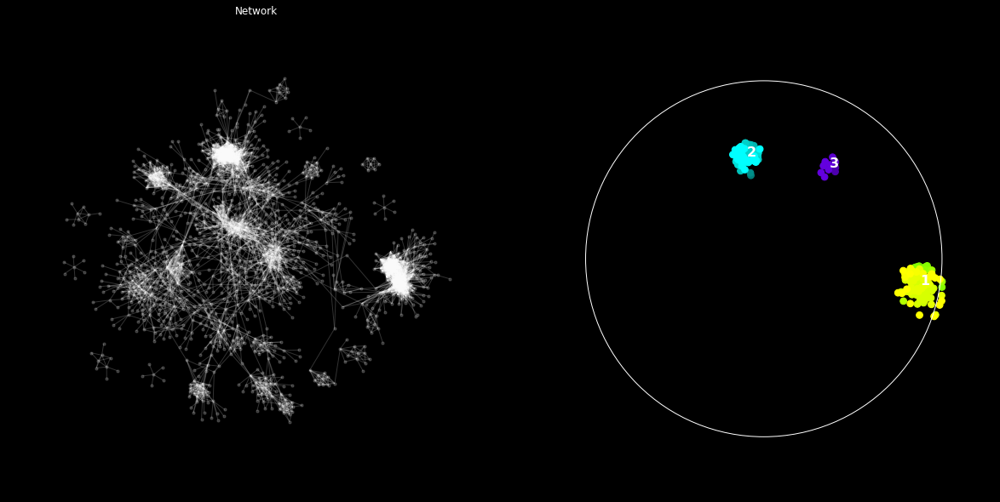

In [22]:
sf.plot_composite_network(show_each_domain=False, save_fig='{output_dir}/top_{input_file}_viz.pdf'.format(output_dir=output_dir, input_file=input_stem))

In [23]:
sf.print_output_files(output_dir=output_file_dir)

/Users/zhangxiang/Downloads/Research_CB/GIN/safepy_network_annotation/043_organic_GMO_circle_updated_CC_100_18000/043_organic_GMO_circle/domain_properties_annotation.txt
/Users/zhangxiang/Downloads/Research_CB/GIN/safepy_network_annotation/043_organic_GMO_circle_updated_CC_100_18000/043_organic_GMO_circle/attribute_properties_annotation.txt
/Users/zhangxiang/Downloads/Research_CB/GIN/safepy_network_annotation/043_organic_GMO_circle_updated_CC_100_18000/043_organic_GMO_circle/node_properties_annotation.txt


In [24]:
sf.save_network(output_file=os.path.join(output_file_dir, input_stem + ".gpickle"))

Part 5 - temporary fix - add GO descriptions to domain_properties_annotation.txt files

Add a column with list of GO descriptions for each of the GO ids in each row

In [2]:
#!/usr/bin/env python3
# -*- coding: utf-8 -*-

from __future__ import with_statement
from collections import defaultdict
from itertools import chain

from tqdm import tqdm

import os.path
import networkx as nx
import pandas as pd
import numpy as np
import pickle
import argparse

In [3]:
# Other functions
def process_go_term(term):

    """
    In an object representing a GO term, replace single-element lists with
    their only member.
    __author__ = "Uli Köhler"
    __copyright__ = "Copyright 2013 Uli Köhler"
    __license__ = "Apache v2.0"
    __version__ = "1.1"
    :return: the modified object as a dictionary
    """

    ret = dict(term)  # Input is a defaultdict, might express unexpected behaviour
    for key, value in ret.items():
        if key != 'is_a' and len(value) == 1:
            ret[key] = value[0]
    return ret


def parse_go_obo(path_to_obo):

    """
    Parses a Gene Ontology dump in OBO v1.2 format.
    __author__ = "Uli Köhler"
    __copyright__ = "Copyright 2013 Uli Köhler"
    __license__ = "Apache v2.0"
    __version__ = "1.1"
    :param path_to_obo: Path to the OBO file containing the GO tree
    """

    with open(path_to_obo, "r") as infile:
        current_term = None

        for line in infile:

            line = line.strip()

            if not line:
                # Skip empty
                continue

            if line == "[Term]":
                if current_term:
                    yield process_go_term(current_term)
                current_term = defaultdict(list)

            elif line == "[Typedef]":
                # Skip [Typedef sections]
                current_term = None

            else:  # Not [Term]
                # Only process if we're inside a [Term] environment
                if current_term is None:
                    continue
                key, sep, val = line.partition(":")
                val_id, val_sep, val_rest = val.partition("!")
                current_term[key].append(val_id.strip())

        # Add last term
        if current_term is not None:
            yield process_go_term(current_term)


def get_go_graph(path_to_obo):

    _, ext = os.path.splitext(path_to_obo)

    # If pickle file passed, the OBO file has already been processed, just load.
    if ext == '.p':
        with open(path_to_obo, 'r') as f:
            return pd.read_pickle(path_to_obo)

    dirname_obo = os.path.dirname(path_to_obo)

    go_graph = nx.DiGraph()
    go_details = pd.DataFrame(data={'id': 'id', 'name': 'name', 'namespace': 'namespace'}, index=[0])

    # Iterate over GO terms
    term_counter = 0

    print("Parsing the OBO file (may take a few min)...")
    for go_term in parse_go_obo(path_to_obo):

        # Ignore the obsolete terms
        if go_term['name'].startswith('obsolete'):
            continue

        # Store terms details
        keys = ['id', 'name', 'namespace']
        go_term_min = dict((k, go_term[k]) for k in keys if k in go_term)
        df = pd.DataFrame(data=go_term_min, index=[0])
        go_details = go_details.append(df)

        if not go_term['id'] in go_graph.nodes():
            go_graph.add_node(go_term['id'], namespace=go_term['namespace'])

        if 'is_a' in go_term:
            for parent_term in go_term['is_a']:
                if parent_term not in go_graph.nodes():
                    go_graph.add_node(parent_term, namespace=go_term['namespace'])
                go_graph.add_edges_from([(parent_term, go_term['id'])])

        term_counter += 1

    go_details.index = go_details['id']
    go_details.drop('id', axis=0, inplace=True)

    print("Parsed %d GO terms." % term_counter)

    # Save the data
    output = {'go_graph': go_graph,
              'go_details': go_details}

    # # Save for future re-uses
    # with open(os.path.join(dirname_obo, 'go.p'), 'wb') as handle:
    #     pickle.dump(output, handle)

    return output


def get_predecessors_all(graph, nodes):

    """
    Recursively get all the predecessors of a node or a list of nodes
    :param graph: graph to be transversed
    :param nodes: a single node or a list of nodes for which the list of predecessors is required
    :return: list of predecessor nodes
    """

    if not isinstance(nodes, list):
        nodes = [nodes]

    node_predecessors = [graph.predecessors(node) for node in nodes]    # get all the immediate predecessors
    node_predecessors = list(chain.from_iterable(node_predecessors))    # flatten the list

    if not node_predecessors:   # if reached a root & no more predecessors, stop and return
        return node_predecessors
    else:   # otherwise, get the predecessors of the current list of nodes
        return node_predecessors + get_predecessors_all(graph, node_predecessors)


def store_predecessors_all(graph, node_id=None, predecessors=[]):

    """
    Recursively transverse down the whole tree (or the tree rooted at a certain term) and store each terms predecessors as a node attribute
    :param graph: the tree
    :param node_id: the starting node (if None, then the root of the tree is used as a start)
    :param predecessors: the list of predecessors for the root
    :return: the graph with node attributes stored
    """

    # If starting, start from the root
    if not node_id:
        nodes = [n for n, d in dict(graph.in_degree()).items() if d == 0]
        node_id = nodes[0]
        predecessors = []

    graph.node[node_id]['predecessors'] = predecessors
    node_successors = graph.successors(node_id)

    if node_successors:
        for node_successor in node_successors:
            graph = store_predecessors_all(graph, node_id=node_successor, predecessors=[node_id]+predecessors)

    return graph


def read_annotations(path_to_annotations):

    """
    Read the gene-to-term annotation file
    :param path_to_annotations: input filename
    :return: data frame
    """

    print("Reading the gene-to-GO term annotations...")
    go_annotations = pd.read_csv(path_to_annotations, delimiter='\t', header=None, comment="!",
                                 dtype={1: str, 10: str})
    
    # Changed by Xiang Zhang on 05/24/2021 in order to have the index as gene labels instead of protein
    #go_annotations.index = go_annotations[1]
    go_annotations.index = go_annotations[2]
    return go_annotations

In [4]:
path_to_obo='/Users/zhangxiang/Downloads/Research_CB/GIN/safepy_network_annotation/go-basic.obo'
path_to_annotations='/Users/zhangxiang/Downloads/Research_CB/GIN/safepy_network_annotation/goa_human.gaf'
go_branch='p'

dirname_annotations = os.path.dirname(path_to_annotations)

# Load the GO tree
go = get_go_graph(path_to_obo)
go_graph = go['go_graph']

Parsing the OBO file (may take a few min)...
Parsed 43986 GO terms.


In [8]:
df_go = go['go_details']

In [9]:
df_go

,id,name,namespace
id,,,
GO:0000001,GO:0000001,mitochondrion inheritance,biological_process
GO:0000002,GO:0000002,mitochondrial genome maintenance,biological_process
GO:0000003,GO:0000003,reproduction,biological_process
GO:0000006,GO:0000006,high-affinity zinc transmembrane transporter a...,molecular_function
GO:0000007,GO:0000007,low-affinity zinc ion transmembrane transporte...,molecular_function
GO:0000009,GO:0000009,"alpha-1,6-mannosyltransferase activity",molecular_function
GO:0000010,GO:0000010,trans-hexaprenyltranstransferase activity,molecular_function
GO:0000011,GO:0000011,vacuole inheritance,biological_process
GO:0000012,GO:0000012,single strand break repair,biological_process


In [28]:
def add_description(path_to_domain_annotation, df_go):
    df_domain = pd.read_csv(path_to_domain_annotation, sep='\t', index_col=0)
    description_list = []
    for row in df_domain.iterrows():
        label_list = row[1]['label'].split(', ')
        sub_description_list = []
        for term in label_list:
            if term != 'GO':
                go_term = 'GO:' + term
                sub_description_list.append(df_go.loc[go_term]['name'])
        description_list.append(', '.join(sub_description_list))
    df_domain['GO_description'] = description_list
    return df_domain[['id', 'label', 'GO_description', 'rgba']]

In [29]:
# Start adding the descriptions post-hoc
# BP
path_to_domain_annotation_01_065 = '/Users/zhangxiang/Downloads/Research_CB/GIN/safepy_network_annotation/safe_go_matrix_output/bp_layouts/knn_043_k35_shortpath_weighted_layout_radius_01_threshold_065/knn_043_k35/domain_properties_annotation.txt'
df_domain_01_065 = add_description(path_to_domain_annotation_01_065, df_go)
df_domain_01_065.to_csv(os.path.dirname(path_to_domain_annotation_01_065) + '/domain_properties_annotation_updated.txt', sep='\t')

In [31]:
path_to_domain_annotation_005_065 = '/Users/zhangxiang/Downloads/Research_CB/GIN/safepy_network_annotation/safe_go_matrix_output/bp_layouts/knn_043_k35_shortpath_weighted_layout_radius_005_threshold_065/knn_043_k35/domain_properties_annotation.txt'
df_domain_005_065 = add_description(path_to_domain_annotation_005_065, df_go)
df_domain_005_065.to_csv(os.path.dirname(path_to_domain_annotation_005_065) + '/domain_properties_annotation_updated.txt', sep='\t')

In [32]:
path_to_domain_annotation_006_065 = '/Users/zhangxiang/Downloads/Research_CB/GIN/safepy_network_annotation/safe_go_matrix_output/bp_layouts/knn_043_k35_shortpath_weighted_layout_radius_006_threshold_065/knn_043_k35/domain_properties_annotation.txt'
df_domain_006_065 = add_description(path_to_domain_annotation_006_065, df_go)
df_domain_006_065.to_csv(os.path.dirname(path_to_domain_annotation_006_065) + '/domain_properties_annotation_updated.txt', sep='\t')

In [33]:
path_to_domain_annotation_007_065 = '/Users/zhangxiang/Downloads/Research_CB/GIN/safepy_network_annotation/safe_go_matrix_output/bp_layouts/knn_043_k35_shortpath_weighted_layout_radius_007_threshold_065/knn_043_k35/domain_properties_annotation.txt'
df_domain_007_065 = add_description(path_to_domain_annotation_007_065, df_go)
df_domain_007_065.to_csv(os.path.dirname(path_to_domain_annotation_007_065) + '/domain_properties_annotation_updated.txt', sep='\t')

In [34]:
path_to_domain_annotation_008_065 = '/Users/zhangxiang/Downloads/Research_CB/GIN/safepy_network_annotation/safe_go_matrix_output/bp_layouts/knn_043_k35_shortpath_weighted_layout_radius_008_threshold_065/knn_043_k35/domain_properties_annotation.txt'
df_domain_008_065 = add_description(path_to_domain_annotation_008_065, df_go)
df_domain_008_065.to_csv(os.path.dirname(path_to_domain_annotation_008_065) + '/domain_properties_annotation_updated.txt', sep='\t')

In [35]:
path_to_domain_annotation_009_065 = '/Users/zhangxiang/Downloads/Research_CB/GIN/safepy_network_annotation/safe_go_matrix_output/bp_layouts/knn_043_k35_shortpath_weighted_layout_radius_009_threshold_065/knn_043_k35/domain_properties_annotation.txt'
df_domain_009_065 = add_description(path_to_domain_annotation_009_065, df_go)
df_domain_009_065.to_csv(os.path.dirname(path_to_domain_annotation_009_065) + '/domain_properties_annotation_updated.txt', sep='\t')

In [36]:
# Next, for CC
path_to_domain_annotation_01_065 = '/Users/zhangxiang/Downloads/Research_CB/GIN/safepy_network_annotation/safe_go_matrix_output/cc_layouts/knn_043_k35_cc_shortpath_weighted_layout_radius_01_threshold_065/knn_043_k35/domain_properties_annotation.txt'
df_domain_01_065 = add_description(path_to_domain_annotation_01_065, df_go)
df_domain_01_065.to_csv(os.path.dirname(path_to_domain_annotation_01_065) + '/domain_properties_annotation_updated.txt', sep='\t')

In [37]:
path_to_domain_annotation_005_065 = '/Users/zhangxiang/Downloads/Research_CB/GIN/safepy_network_annotation/safe_go_matrix_output/cc_layouts/knn_043_k35_cc_shortpath_weighted_layout_radius_005_threshold_065/knn_043_k35/domain_properties_annotation.txt'
df_domain_005_065 = add_description(path_to_domain_annotation_005_065, df_go)
df_domain_005_065.to_csv(os.path.dirname(path_to_domain_annotation_005_065) + '/domain_properties_annotation_updated.txt', sep='\t')

In [38]:
path_to_domain_annotation_006_065 = '/Users/zhangxiang/Downloads/Research_CB/GIN/safepy_network_annotation/safe_go_matrix_output/cc_layouts/knn_043_k35_cc_shortpath_weighted_layout_radius_006_threshold_065/knn_043_k35/domain_properties_annotation.txt'
df_domain_006_065 = add_description(path_to_domain_annotation_006_065, df_go)
df_domain_006_065.to_csv(os.path.dirname(path_to_domain_annotation_006_065) + '/domain_properties_annotation_updated.txt', sep='\t')

In [39]:
path_to_domain_annotation_007_065 = '/Users/zhangxiang/Downloads/Research_CB/GIN/safepy_network_annotation/safe_go_matrix_output/cc_layouts/knn_043_k35_cc_shortpath_weighted_layout_radius_007_threshold_065/knn_043_k35/domain_properties_annotation.txt'
df_domain_007_065 = add_description(path_to_domain_annotation_007_065, df_go)
df_domain_007_065.to_csv(os.path.dirname(path_to_domain_annotation_007_065) + '/domain_properties_annotation_updated.txt', sep='\t')

In [40]:
path_to_domain_annotation_008_065 = '/Users/zhangxiang/Downloads/Research_CB/GIN/safepy_network_annotation/safe_go_matrix_output/cc_layouts/knn_043_k35_cc_shortpath_weighted_layout_radius_008_threshold_065/knn_043_k35/domain_properties_annotation.txt'
df_domain_008_065 = add_description(path_to_domain_annotation_008_065, df_go)
df_domain_008_065.to_csv(os.path.dirname(path_to_domain_annotation_008_065) + '/domain_properties_annotation_updated.txt', sep='\t')

In [41]:
path_to_domain_annotation_009_065 = '/Users/zhangxiang/Downloads/Research_CB/GIN/safepy_network_annotation/safe_go_matrix_output/cc_layouts/knn_043_k35_cc_shortpath_weighted_layout_radius_009_threshold_065/knn_043_k35/domain_properties_annotation.txt'
df_domain_009_065 = add_description(path_to_domain_annotation_009_065, df_go)
df_domain_009_065.to_csv(os.path.dirname(path_to_domain_annotation_009_065) + '/domain_properties_annotation_updated.txt', sep='\t')

Part 6 - long term fix - add GO descriptions to the annotation file

Strategy: before outputing the final go matrix for annotation file, use the info in go['go_details'] to add the descriptions for the terms in the column. This would require an extra function.

In [51]:
def add_description_to_go_matrix(go_matrix, df_go_details):
    go_term_list = go_matrix.columns.tolist()
    new_go_list = []
    for go_term in go_term_list:
        new_go_list.append(go_term + ' ' + df_go.loc[go_term]['name'])
    go_matrix.columns = new_go_list
    return go_matrix

In [52]:
go_matrix_bp = pd.read_csv('/Users/zhangxiang/Downloads/Research_CB/GIN/safepy_network_annotation/safe_go_matrix_output/GO_BP_5_200/go_p_matrix_5_200.txt',index_col=0,sep='\t')

In [53]:
go_matrix_bp_new = add_description_to_go_matrix(go_matrix_bp, go['go_details'])

In [54]:
go_matrix_bp_new

,GO:0000002 mitochondrial genome maintenance,GO:0000012 single strand break repair,GO:0000018 regulation of DNA recombination,GO:0000027 ribosomal large subunit assembly,GO:0000028 ribosomal small subunit assembly,GO:0000038 very long-chain fatty acid metabolic process,GO:0000041 transition metal ion transport,GO:0000045 autophagosome assembly,GO:0000050 urea cycle,GO:0000054 ribosomal subunit export from nucleus,...,GO:2001244 positive regulation of intrinsic apoptotic signaling pathway,GO:2001256 regulation of store-operated calcium entry,GO:2001257 regulation of cation channel activity,GO:2001258 negative regulation of cation channel activity,GO:2001259 positive regulation of cation channel activity,GO:2001268 negative regulation of cysteine-type endopeptidase activity involved in apoptotic signaling pathway,GO:2001269 positive regulation of cysteine-type endopeptidase activity involved in apoptotic signaling pathway,GO:2001280 positive regulation of unsaturated fatty acid biosynthetic process,GO:2001286 regulation of caveolin-mediated endocytosis,GO:0008150 biological_process
A0A087WT57,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
A0A087WUV0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
A0A087WVE0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
A0A087WW49,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
A0A087WWC5,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
A0A087WZV9,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
A0A087X0B3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
A0A087X1B8,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
A0A096LPH7,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
A0A096LPI6,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1


In [55]:
go_matrix_bp_new.to_csv('/Users/zhangxiang/Downloads/Research_CB/GIN/safepy_network_annotation/safe_go_matrix_output/GO_BP_5_200/go_p_matrix_5_200_updated.txt', sep='\t')

In [72]:
path_to_obo='/Users/zhangxiang/Downloads/Research_CB/GIN/safepy_network_annotation/go-basic.obo'
path_to_annotations='/Users/zhangxiang/Downloads/Research_CB/GIN/safepy_network_annotation/goa_human.gaf'
go_branch='p'

dirname_annotations = os.path.dirname(path_to_annotations)

# Load the GO tree
# go = get_go_graph(path_to_obo)
# go_graph = go['go_graph']

# Load the annotations
go_annotations = read_annotations(path_to_annotations)

# Change the output pickle file
output = {'go_matrix': go_matrix_bp_new,
          'go_details': go['go_details'],
          'locus_details': go_annotations,
          'tree_path': path_to_obo,
          'annotations_path': path_to_annotations}

pickle_path = os.path.join(dirname_annotations, 'go_' + go_branch + '_5_200_updated.p')
print("Saving the results at %s" % pickle_path)
with open(pickle_path, 'wb') as handle:
    pickle.dump(output, handle)

Reading the gene-to-GO term annotations...


/Users/zhangxiang/opt/anaconda3/envs/safe_env2/lib/python3.6/site-packages/IPython/core/interactiveshell.py:3263: DtypeWarning: Columns (15) have mixed types. Specify dtype option on import or set low_memory=False.
  if (await self.run_code(code, result,  async_=asy)):


Saving the results at /Users/zhangxiang/Downloads/Research_CB/GIN/safepy_network_annotation/go_p_5_200_updated.p


In [56]:
# Test for SAFE output

In [57]:
# Generate outputs for CC
import sys
from os.path import expanduser

# Add path to folder containing safepy
sys.path.append(expanduser('~') + '/Downloads/Research_CB/GIN/safepy_network_annotation/safepy/')

import safe

%matplotlib inline

In [58]:
sf = safe.SAFE()
# Add the path to the input data file - test with our latest network file
input_file = expanduser('~') + '/Downloads/Research_CB/GIN/safepy_network_annotation/043_organic_GMO_circle.cys'

In [59]:
sf.load_network(network_file=input_file, node_key_attribute="gene")

Loading network from /Users/zhangxiang/Downloads/Research_CB/GIN/safepy_network_annotation/043_organic_GMO_circle.cys
Loading the cys file /Users/zhangxiang/Downloads/Research_CB/GIN/safepy_network_annotation/043_organic_GMO_circle.cys...
Loading the first view: CytoscapeSession-2021_02_26-15_59/views/8569-25697-edges_043_redundant.txt.xgmml
Loading the first network: CytoscapeSession-2021_02_26-15_59/networks/8543-edges_043_circular.xgmml
Calculating edge lengths...


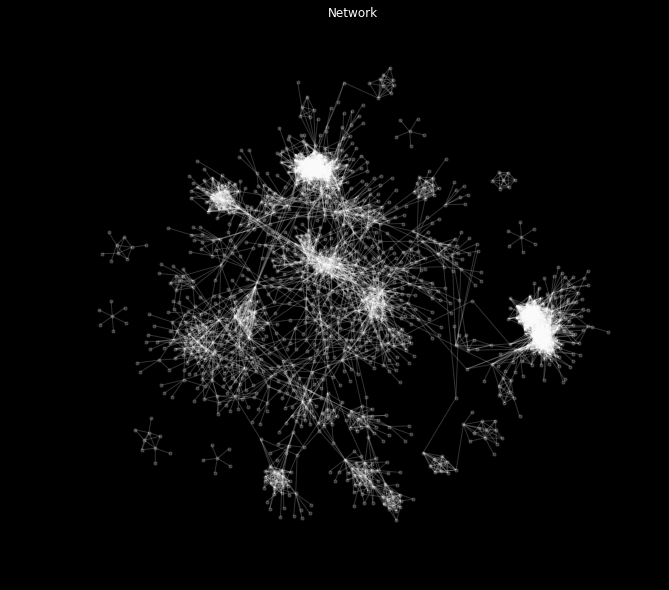

In [60]:
sf.plot_network()

In [61]:
# load attribute with go_p_matrix_5_200_updated.txt --- BP
sf.load_attributes(attribute_file='/Users/zhangxiang/Downloads/Research_CB/GIN/safepy_network_annotation/safe_go_matrix_output/GO_BP_5_200/go_p_matrix_5_200_updated.txt')

Loading attributes from /Users/zhangxiang/Downloads/Research_CB/GIN/safepy_network_annotation/safe_go_matrix_output/GO_BP_5_200/go_p_matrix_5_200_updated.txt

Attribute data provided: 19719 labels x 5972 attributes
A0A087WT57, A0A087WUV0, A0A087WVE0 and 18415 other labels in the attribute file were not found in the network.

Attribute data mapped onto the network: 1301 labels x 5972 attributes
Values: 698724 NaNs
Values: 7752551 zeros
Values: 17021 positives
Values: 0 negatives


In [62]:
sf.define_neighborhoods(node_distance_metric='euclidean', neighborhood_radius=0.05)

Node distance metric: euclidean
Neighborhood definition: 0.05 x diameter
Number of nodes per neighborhood (mean +/- std): 34.01 +/- 22.75


In [63]:
sf.compute_pvalues(multiple_testing=True)

Overwriting global settings:
	multiple_testing=True
Using the hypergeometric test to calculate enrichment...
Running FDR-adjustment of p-values...


In [64]:
sf.define_top_attributes()

Criteria for top attributes:
- minimum number of enriched neighborhoods: 10
- region-specific distribution of enriched neighborhoods as defined by: connectivity
Number of top attributes: 70


In [65]:
sf.define_domains(attribute_distance_threshold=0.65)

Number of domains: 14 (containing 1-10 attributes)


In [66]:
sf.trim_domains()

Removed 3 domains because they were the top choice for less than 10 neighborhoods.


In [67]:
# print output
import os
from pathlib import Path
output_dir = expanduser('~') + '/Downloads/Research_CB/GIN/safepy_network_annotation/043_organic_GMO_circle_updated_BP_5_200_updated'
input_stem = Path(input_file).stem
output_file_dir = os.path.join(output_dir, input_stem)
if not os.path.exists(output_file_dir):
    os.makedirs(output_file_dir)

Output path: /Users/zhangxiang/Downloads/Research_CB/GIN/safepy_network_annotation/043_organic_GMO_circle_updated_BP_5_200_updated/043_organic_GMO_circle_viz.pdf


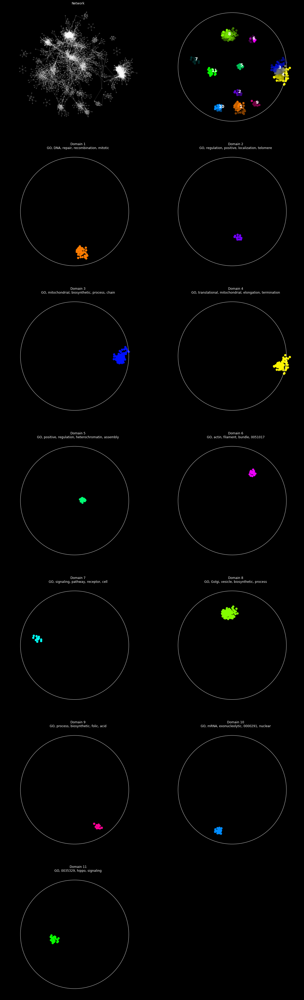

In [68]:
sf.plot_composite_network(show_each_domain=True, save_fig='{output_dir}/{input_file}_viz.pdf'.format(output_dir=output_dir, input_file=input_stem))

Output path: /Users/zhangxiang/Downloads/Research_CB/GIN/safepy_network_annotation/043_organic_GMO_circle_updated_BP_5_200_updated/top_043_organic_GMO_circle_viz.pdf


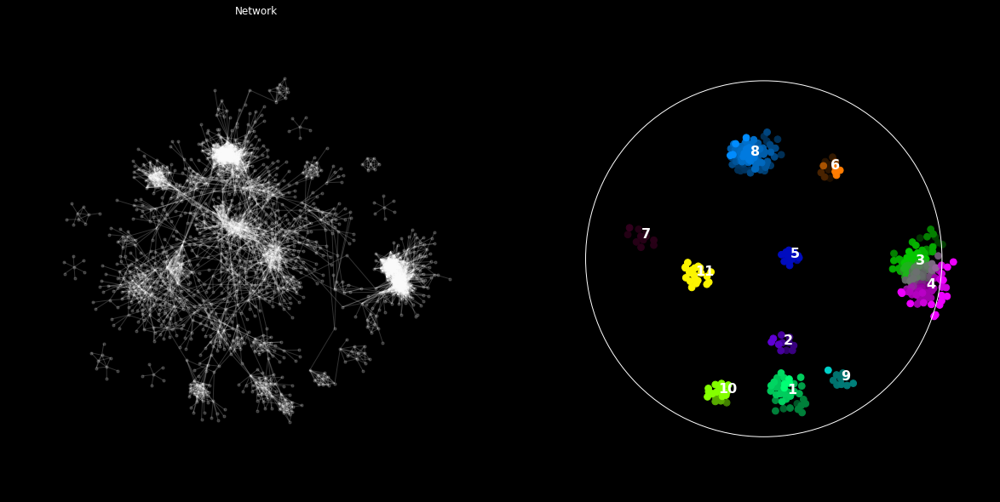

In [69]:
sf.plot_composite_network(show_each_domain=False, save_fig='{output_dir}/top_{input_file}_viz.pdf'.format(output_dir=output_dir, input_file=input_stem))

In [70]:
sf.print_output_files(output_dir=output_file_dir)

/Users/zhangxiang/Downloads/Research_CB/GIN/safepy_network_annotation/043_organic_GMO_circle_updated_BP_5_200_updated/043_organic_GMO_circle/domain_properties_annotation.txt
/Users/zhangxiang/Downloads/Research_CB/GIN/safepy_network_annotation/043_organic_GMO_circle_updated_BP_5_200_updated/043_organic_GMO_circle/attribute_properties_annotation.txt
/Users/zhangxiang/Downloads/Research_CB/GIN/safepy_network_annotation/043_organic_GMO_circle_updated_BP_5_200_updated/043_organic_GMO_circle/node_properties_annotation.txt


In [71]:
sf.save_network(output_file=os.path.join(output_file_dir, input_stem + ".gpickle"))

In [ ]:
# Next, for CC 5_200

In [73]:
go_matrix_cc = pd.read_csv('/Users/zhangxiang/Downloads/Research_CB/GIN/safepy_network_annotation/safe_go_matrix_output/GO_CC_5_200/go_c_matrix_5_200.txt',index_col=0,sep='\t')

In [74]:
go_matrix_cc_new = add_description_to_go_matrix(go_matrix_cc, go['go_details'])

In [75]:
go_matrix_cc_new

,GO:0000109 nucleotide-excision repair complex,GO:0000118 histone deacetylase complex,GO:0000123 histone acetyltransferase complex,GO:0000124 SAGA complex,GO:0000127 transcription factor TFIIIC complex,GO:0000137 Golgi cis cisterna,GO:0000138 Golgi trans cisterna,GO:0000145 exocyst,GO:0000152 nuclear ubiquitin ligase complex,GO:0000153 cytoplasmic ubiquitin ligase complex,...,GO:1990498 mitotic spindle microtubule,GO:1990531 phospholipid-translocating ATPase complex,GO:1990635 proximal dendrite,GO:1990712 HFE-transferrin receptor complex,GO:1990752 microtubule end,GO:1990777 lipoprotein particle,GO:1990907 beta-catenin-TCF complex,GO:1990909 Wnt signalosome,GO:1990913 sperm head plasma membrane,GO:0005575 cellular_component
A0A087WT57,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
A0A087WUV0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
A0A087WVE0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
A0A087WW49,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
A0A087WWC5,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
A0A087WZV9,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
A0A087X0B3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
A0A087X1B8,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
A0A096LPH7,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
A0A096LPI6,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1


In [76]:
go_matrix_cc_new.to_csv('/Users/zhangxiang/Downloads/Research_CB/GIN/safepy_network_annotation/safe_go_matrix_output/GO_CC_5_200/go_c_matrix_5_200_updated.txt', sep='\t')

In [77]:
#path_to_obo='/Users/zhangxiang/Downloads/Research_CB/GIN/safepy_network_annotation/go-basic.obo'
#path_to_annotations='/Users/zhangxiang/Downloads/Research_CB/GIN/safepy_network_annotation/goa_human.gaf'
go_branch='c'

#dirname_annotations = os.path.dirname(path_to_annotations)

# Load the GO tree
# go = get_go_graph(path_to_obo)
# go_graph = go['go_graph']

# Load the annotations
#go_annotations = read_annotations(path_to_annotations)

# Change the output pickle file
output = {'go_matrix': go_matrix_cc_new,
          'go_details': go['go_details'],
          'locus_details': go_annotations,
          'tree_path': path_to_obo,
          'annotations_path': path_to_annotations}

pickle_path = os.path.join(dirname_annotations, 'go_' + go_branch + '_5_200_updated.p')
print("Saving the results at %s" % pickle_path)
with open(pickle_path, 'wb') as handle:
    pickle.dump(output, handle)

Saving the results at /Users/zhangxiang/Downloads/Research_CB/GIN/safepy_network_annotation/go_c_5_200_updated.p


In [78]:
# Test for SAFE output

In [79]:
# Generate outputs for CC
import sys
from os.path import expanduser

# Add path to folder containing safepy
sys.path.append(expanduser('~') + '/Downloads/Research_CB/GIN/safepy_network_annotation/safepy/')

import safe

%matplotlib inline

In [80]:
sf = safe.SAFE()
# Add the path to the input data file - test with our latest network file
input_file = expanduser('~') + '/Downloads/Research_CB/GIN/safepy_network_annotation/043_organic_GMO_circle.cys'

In [81]:
sf.load_network(network_file=input_file, node_key_attribute="gene")

Loading network from /Users/zhangxiang/Downloads/Research_CB/GIN/safepy_network_annotation/043_organic_GMO_circle.cys
Loading the cys file /Users/zhangxiang/Downloads/Research_CB/GIN/safepy_network_annotation/043_organic_GMO_circle.cys...
Loading the first view: CytoscapeSession-2021_02_26-15_59/views/8569-25697-edges_043_redundant.txt.xgmml
Loading the first network: CytoscapeSession-2021_02_26-15_59/networks/8543-edges_043_circular.xgmml
Calculating edge lengths...


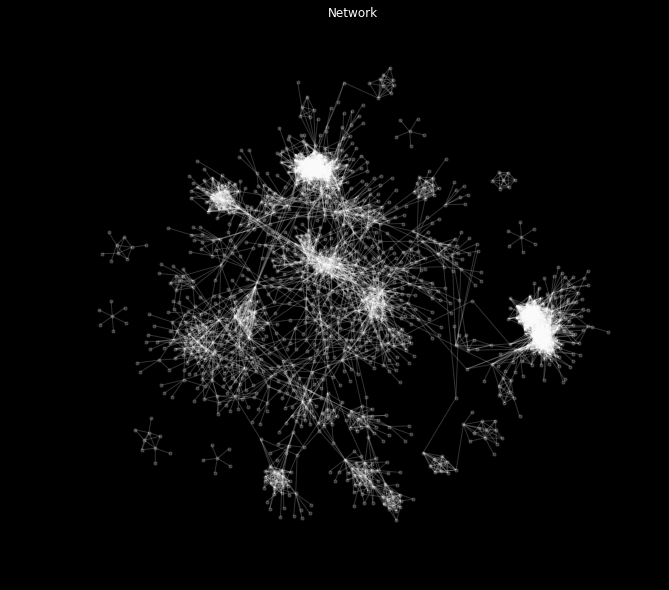

In [82]:
sf.plot_network()

In [83]:
# load attribute with go_c_matrix_5_200_updated.txt --- CC
sf.load_attributes(attribute_file='/Users/zhangxiang/Downloads/Research_CB/GIN/safepy_network_annotation/safe_go_matrix_output/GO_CC_5_200/go_c_matrix_5_200_updated.txt')

Loading attributes from /Users/zhangxiang/Downloads/Research_CB/GIN/safepy_network_annotation/safe_go_matrix_output/GO_CC_5_200/go_c_matrix_5_200_updated.txt

Attribute data provided: 19719 labels x 874 attributes
A0A087WT57, A0A087WUV0, A0A087WVE0 and 18415 other labels in the attribute file were not found in the network.

Attribute data mapped onto the network: 1301 labels x 874 attributes
Values: 102258 NaNs
Values: 1132742 zeros
Values: 4332 positives
Values: 0 negatives


In [84]:
sf.define_neighborhoods(node_distance_metric='euclidean', neighborhood_radius=0.05)

Node distance metric: euclidean
Neighborhood definition: 0.05 x diameter
Number of nodes per neighborhood (mean +/- std): 34.01 +/- 22.75


In [85]:
sf.compute_pvalues(multiple_testing=True)

Overwriting global settings:
	multiple_testing=True
Using the hypergeometric test to calculate enrichment...
Running FDR-adjustment of p-values...


In [86]:
sf.define_top_attributes()

Criteria for top attributes:
- minimum number of enriched neighborhoods: 10
- region-specific distribution of enriched neighborhoods as defined by: connectivity
Number of top attributes: 34


In [87]:
sf.define_domains(attribute_distance_threshold=0.65)

Number of domains: 9 (containing 1-9 attributes)


In [88]:
sf.trim_domains()

Removed 1 domains because they were the top choice for less than 10 neighborhoods.


In [89]:
# print output
import os
from pathlib import Path
output_dir = expanduser('~') + '/Downloads/Research_CB/GIN/safepy_network_annotation/043_organic_GMO_circle_updated_CC_5_200_updated'
input_stem = Path(input_file).stem
output_file_dir = os.path.join(output_dir, input_stem)
if not os.path.exists(output_file_dir):
    os.makedirs(output_file_dir)

Output path: /Users/zhangxiang/Downloads/Research_CB/GIN/safepy_network_annotation/043_organic_GMO_circle_updated_CC_5_200_updated/043_organic_GMO_circle_viz.pdf


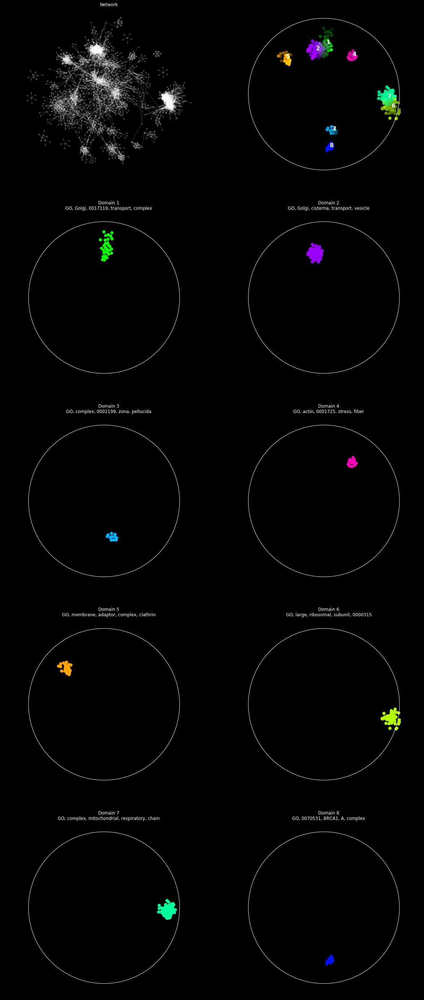

In [90]:
sf.plot_composite_network(show_each_domain=True, save_fig='{output_dir}/{input_file}_viz.pdf'.format(output_dir=output_dir, input_file=input_stem))

Output path: /Users/zhangxiang/Downloads/Research_CB/GIN/safepy_network_annotation/043_organic_GMO_circle_updated_CC_5_200_updated/top_043_organic_GMO_circle_viz.pdf


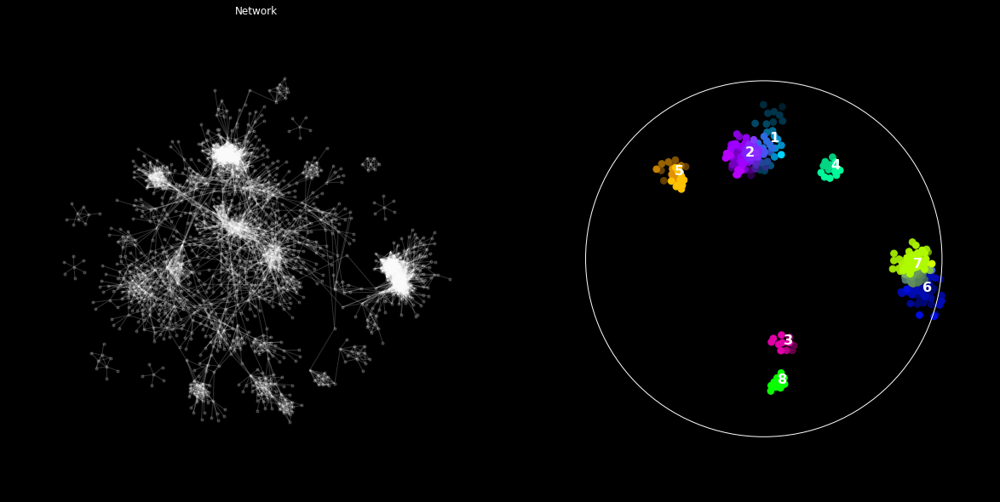

In [91]:
sf.plot_composite_network(show_each_domain=False, save_fig='{output_dir}/top_{input_file}_viz.pdf'.format(output_dir=output_dir, input_file=input_stem))

In [92]:
sf.print_output_files(output_dir=output_file_dir)

/Users/zhangxiang/Downloads/Research_CB/GIN/safepy_network_annotation/043_organic_GMO_circle_updated_CC_5_200_updated/043_organic_GMO_circle/domain_properties_annotation.txt
/Users/zhangxiang/Downloads/Research_CB/GIN/safepy_network_annotation/043_organic_GMO_circle_updated_CC_5_200_updated/043_organic_GMO_circle/attribute_properties_annotation.txt
/Users/zhangxiang/Downloads/Research_CB/GIN/safepy_network_annotation/043_organic_GMO_circle_updated_CC_5_200_updated/043_organic_GMO_circle/node_properties_annotation.txt


In [93]:
sf.save_network(output_file=os.path.join(output_file_dir, input_stem + ".gpickle"))

In [ ]:
# Next, for CC 100_18000

In [94]:
go_matrix_cc_100_18000 = pd.read_csv('/Users/zhangxiang/Downloads/Research_CB/GIN/safepy_network_annotation/safe_go_matrix_output/GO_CC_100_18000/go_c_matrix_100_18000.txt',index_col=0,sep='\t')

In [95]:
go_matrix_cc_100_18000_new = add_description_to_go_matrix(go_matrix_cc_100_18000, go['go_details'])

In [96]:
go_matrix_cc_100_18000_new

,GO:0000139 Golgi membrane,GO:0000151 ubiquitin ligase complex,GO:0000323 lytic vacuole,GO:0000776 kinetochore,"GO:0000781 chromosome, telomeric region",GO:0000785 chromatin,GO:0000922 spindle pole,GO:0001650 fibrillar center,GO:0005576 extracellular region,GO:0005615 extracellular space,...,GO:0140535 intracellular protein-containing complex,GO:1902494 catalytic complex,GO:1902495 transmembrane transporter complex,GO:1903561 extracellular vesicle,GO:1904813 ficolin-1-rich granule lumen,GO:1990204 oxidoreductase complex,GO:1990234 transferase complex,GO:1990351 transporter complex,GO:1990904 ribonucleoprotein complex,GO:0005575 cellular_component
A0A087WT57,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
A0A087WUV0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
A0A087WVE0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
A0A087WW49,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
A0A087WWC5,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
A0A087WZV9,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
A0A087X0B3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
A0A087X1B8,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
A0A096LPH7,0,0,0,0,0,0,0,0,0,0,...,1,0,0,0,0,0,0,0,0,1
A0A096LPI6,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1


In [97]:
go_matrix_cc_100_18000_new.to_csv('/Users/zhangxiang/Downloads/Research_CB/GIN/safepy_network_annotation/safe_go_matrix_output/GO_CC_100_18000/go_c_matrix_100_18000_updated.txt', sep='\t')

In [98]:
#path_to_obo='/Users/zhangxiang/Downloads/Research_CB/GIN/safepy_network_annotation/go-basic.obo'
#path_to_annotations='/Users/zhangxiang/Downloads/Research_CB/GIN/safepy_network_annotation/goa_human.gaf'
go_branch='c'

#dirname_annotations = os.path.dirname(path_to_annotations)

# Load the GO tree
# go = get_go_graph(path_to_obo)
# go_graph = go['go_graph']

# Load the annotations
#go_annotations = read_annotations(path_to_annotations)

# Change the output pickle file
output = {'go_matrix': go_matrix_cc_100_18000_new,
          'go_details': go['go_details'],
          'locus_details': go_annotations,
          'tree_path': path_to_obo,
          'annotations_path': path_to_annotations}

pickle_path = os.path.join(dirname_annotations, 'go_' + go_branch + '_100_18000_updated.p')
print("Saving the results at %s" % pickle_path)
with open(pickle_path, 'wb') as handle:
    pickle.dump(output, handle)

Saving the results at /Users/zhangxiang/Downloads/Research_CB/GIN/safepy_network_annotation/go_c_100_18000_updated.p


In [99]:
# Test for SAFE output

In [100]:
# Generate outputs for CC
import sys
from os.path import expanduser

# Add path to folder containing safepy
sys.path.append(expanduser('~') + '/Downloads/Research_CB/GIN/safepy_network_annotation/safepy/')

import safe

%matplotlib inline

In [101]:
sf = safe.SAFE()
# Add the path to the input data file - test with our latest network file
input_file = expanduser('~') + '/Downloads/Research_CB/GIN/safepy_network_annotation/043_organic_GMO_circle.cys'

In [102]:
sf.load_network(network_file=input_file, node_key_attribute="gene")

Loading network from /Users/zhangxiang/Downloads/Research_CB/GIN/safepy_network_annotation/043_organic_GMO_circle.cys
Loading the cys file /Users/zhangxiang/Downloads/Research_CB/GIN/safepy_network_annotation/043_organic_GMO_circle.cys...
Loading the first view: CytoscapeSession-2021_02_26-15_59/views/8569-25697-edges_043_redundant.txt.xgmml
Loading the first network: CytoscapeSession-2021_02_26-15_59/networks/8543-edges_043_circular.xgmml
Calculating edge lengths...


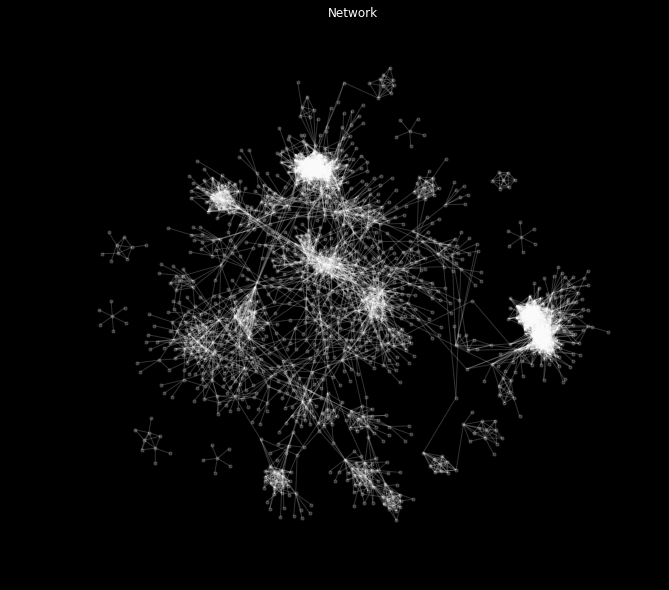

In [103]:
sf.plot_network()

In [104]:
# load attribute with go_c_matrix_100_18000_updated.txt --- CC
sf.load_attributes(attribute_file='/Users/zhangxiang/Downloads/Research_CB/GIN/safepy_network_annotation/safe_go_matrix_output/GO_CC_100_18000/go_c_matrix_100_18000_updated.txt')

Loading attributes from /Users/zhangxiang/Downloads/Research_CB/GIN/safepy_network_annotation/safe_go_matrix_output/GO_CC_100_18000/go_c_matrix_100_18000_updated.txt

Attribute data provided: 19719 labels x 199 attributes
A0A087WT57, A0A087WUV0, A0A087WVE0 and 18415 other labels in the attribute file were not found in the network.

Attribute data mapped onto the network: 1301 labels x 199 attributes
Values: 23283 NaNs
Values: 243669 zeros
Values: 15230 positives
Values: 0 negatives


In [105]:
sf.define_neighborhoods(node_distance_metric='euclidean', neighborhood_radius=0.05)

Node distance metric: euclidean
Neighborhood definition: 0.05 x diameter
Number of nodes per neighborhood (mean +/- std): 34.01 +/- 22.75


In [106]:
sf.compute_pvalues(multiple_testing=True)

Overwriting global settings:
	multiple_testing=True
Using the hypergeometric test to calculate enrichment...
Running FDR-adjustment of p-values...


In [107]:
sf.define_top_attributes()

Criteria for top attributes:
- minimum number of enriched neighborhoods: 10
- region-specific distribution of enriched neighborhoods as defined by: connectivity
Number of top attributes: 5


In [108]:
sf.define_domains(attribute_distance_threshold=0.65)

Number of domains: 3 (containing 1-2 attributes)


In [109]:
sf.trim_domains()

Removed 0 domains because they were the top choice for less than 10 neighborhoods.


In [110]:
# print output
import os
from pathlib import Path
output_dir = expanduser('~') + '/Downloads/Research_CB/GIN/safepy_network_annotation/043_organic_GMO_circle_updated_CC_100_18000_updated'
input_stem = Path(input_file).stem
output_file_dir = os.path.join(output_dir, input_stem)
if not os.path.exists(output_file_dir):
    os.makedirs(output_file_dir)

Output path: /Users/zhangxiang/Downloads/Research_CB/GIN/safepy_network_annotation/043_organic_GMO_circle_updated_CC_100_18000_updated/043_organic_GMO_circle_viz.pdf


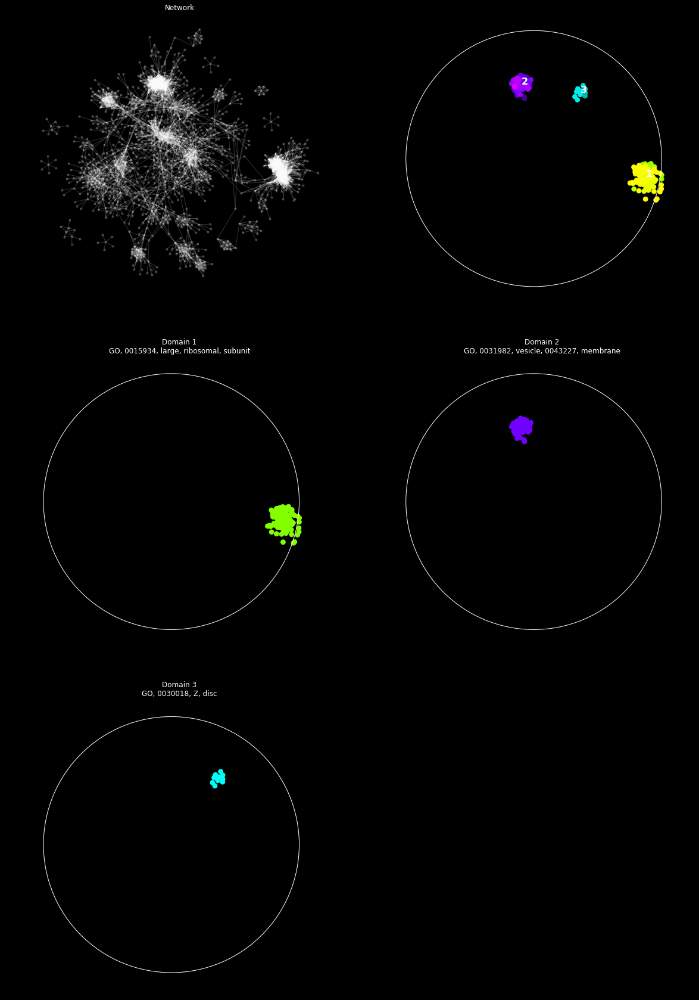

In [111]:
sf.plot_composite_network(show_each_domain=True, save_fig='{output_dir}/{input_file}_viz.pdf'.format(output_dir=output_dir, input_file=input_stem))

Output path: /Users/zhangxiang/Downloads/Research_CB/GIN/safepy_network_annotation/043_organic_GMO_circle_updated_CC_100_18000_updated/top_043_organic_GMO_circle_viz.pdf


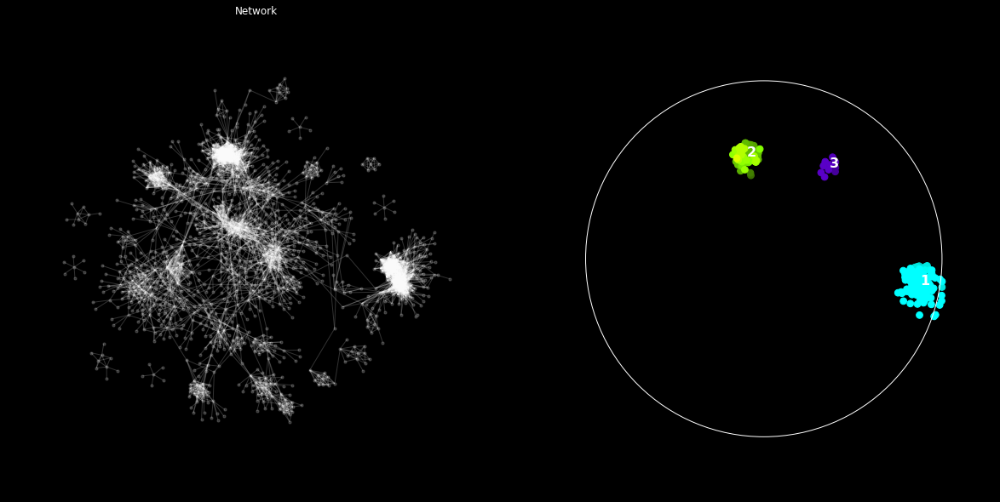

In [112]:
sf.plot_composite_network(show_each_domain=False, save_fig='{output_dir}/top_{input_file}_viz.pdf'.format(output_dir=output_dir, input_file=input_stem))

In [113]:
sf.print_output_files(output_dir=output_file_dir)

/Users/zhangxiang/Downloads/Research_CB/GIN/safepy_network_annotation/043_organic_GMO_circle_updated_CC_100_18000_updated/043_organic_GMO_circle/domain_properties_annotation.txt
/Users/zhangxiang/Downloads/Research_CB/GIN/safepy_network_annotation/043_organic_GMO_circle_updated_CC_100_18000_updated/043_organic_GMO_circle/attribute_properties_annotation.txt
/Users/zhangxiang/Downloads/Research_CB/GIN/safepy_network_annotation/043_organic_GMO_circle_updated_CC_100_18000_updated/043_organic_GMO_circle/node_properties_annotation.txt


In [114]:
sf.save_network(output_file=os.path.join(output_file_dir, input_stem + ".gpickle"))

Part 7 - based on the genes that originally defined the layout, we would like to add a column in the file node_properties_annotation.txt to indicate core/non-core

In [115]:
df_default_node = pd.read_csv('/Users/zhangxiang/Downloads/Research_CB/GIN/safepy_network_annotation/edges_043_organic_default_node.csv', index_col=0)

In [116]:
df_default_node

,gene,label,name,selected,shared name,x,y
SUID,,,,,,,
72,ZSWIM7,NaN,ZSWIM7,False,ZSWIM7,NaN,NaN
73,ZSWIM4,NaN,ZSWIM4,False,ZSWIM4,NaN,NaN
74,KDM6A,NaN,KDM6A,False,KDM6A,NaN,NaN
75,KDM2A,NaN,KDM2A,False,KDM2A,NaN,NaN
76,ZSWIM6,NaN,ZSWIM6,False,ZSWIM6,NaN,NaN
77,ZRSR2,NaN,ZRSR2,False,ZRSR2,NaN,NaN
78,ZRANB1,NaN,ZRANB1,False,ZRANB1,NaN,NaN
79,ZNF800,NaN,ZNF800,False,ZNF800,NaN,NaN
80,ZNF787,NaN,ZNF787,False,ZNF787,NaN,NaN


In [120]:
def add_core_column(df_node_anno, df_default_node):
    core_name_list = df_default_node['name'].tolist()
    core_verdict_list = []
    for row in df_node_anno.iterrows():
        if row[1]['label'] in core_name_list:
            core_verdict_list.append('core')
        else:
            core_verdict_list.append('non-core')
    df_node_anno['core/non-core'] = core_verdict_list
    return df_node_anno

In [123]:
# 6 files for BP
df_node_anno_01_065 = pd.read_csv('/Users/zhangxiang/Downloads/Research_CB/GIN/safepy_network_annotation/safe_go_matrix_output/bp_layouts_updated/knn_043_k35_shortpath_weighted_layout_radius_01_threshold_065/knn_043_k35/node_properties_annotation.txt', index_col=0, sep='\t')
df_node_anno_01_065 = add_core_column(df_node_anno_01_065, df_default_node)
df_node_anno_01_065.to_csv('/Users/zhangxiang/Downloads/Research_CB/GIN/safepy_network_annotation/safe_go_matrix_output/bp_layouts_updated/knn_043_k35_shortpath_weighted_layout_radius_01_threshold_065/knn_043_k35/node_properties_annotation_updated.txt', sep='\t')

In [124]:
df_node_anno_005_065 = pd.read_csv('/Users/zhangxiang/Downloads/Research_CB/GIN/safepy_network_annotation/safe_go_matrix_output/bp_layouts_updated/knn_043_k35_shortpath_weighted_layout_radius_005_threshold_065/knn_043_k35/node_properties_annotation.txt', index_col=0, sep='\t')
df_node_anno_005_065 = add_core_column(df_node_anno_005_065, df_default_node)
df_node_anno_005_065.to_csv('/Users/zhangxiang/Downloads/Research_CB/GIN/safepy_network_annotation/safe_go_matrix_output/bp_layouts_updated/knn_043_k35_shortpath_weighted_layout_radius_005_threshold_065/knn_043_k35/node_properties_annotation_updated.txt', sep='\t')

In [125]:
df_node_anno_006_065 = pd.read_csv('/Users/zhangxiang/Downloads/Research_CB/GIN/safepy_network_annotation/safe_go_matrix_output/bp_layouts_updated/knn_043_k35_shortpath_weighted_layout_radius_006_threshold_065/knn_043_k35/node_properties_annotation.txt', index_col=0, sep='\t')
df_node_anno_006_065 = add_core_column(df_node_anno_006_065, df_default_node)
df_node_anno_006_065.to_csv('/Users/zhangxiang/Downloads/Research_CB/GIN/safepy_network_annotation/safe_go_matrix_output/bp_layouts_updated/knn_043_k35_shortpath_weighted_layout_radius_006_threshold_065/knn_043_k35/node_properties_annotation_updated.txt', sep='\t')

In [126]:
df_node_anno_007_065 = pd.read_csv('/Users/zhangxiang/Downloads/Research_CB/GIN/safepy_network_annotation/safe_go_matrix_output/bp_layouts_updated/knn_043_k35_shortpath_weighted_layout_radius_007_threshold_065/knn_043_k35/node_properties_annotation.txt', index_col=0, sep='\t')
df_node_anno_007_065 = add_core_column(df_node_anno_007_065, df_default_node)
df_node_anno_007_065.to_csv('/Users/zhangxiang/Downloads/Research_CB/GIN/safepy_network_annotation/safe_go_matrix_output/bp_layouts_updated/knn_043_k35_shortpath_weighted_layout_radius_007_threshold_065/knn_043_k35/node_properties_annotation_updated.txt', sep='\t')

In [127]:
df_node_anno_008_065 = pd.read_csv('/Users/zhangxiang/Downloads/Research_CB/GIN/safepy_network_annotation/safe_go_matrix_output/bp_layouts_updated/knn_043_k35_shortpath_weighted_layout_radius_008_threshold_065/knn_043_k35/node_properties_annotation.txt', index_col=0, sep='\t')
df_node_anno_008_065 = add_core_column(df_node_anno_008_065, df_default_node)
df_node_anno_008_065.to_csv('/Users/zhangxiang/Downloads/Research_CB/GIN/safepy_network_annotation/safe_go_matrix_output/bp_layouts_updated/knn_043_k35_shortpath_weighted_layout_radius_008_threshold_065/knn_043_k35/node_properties_annotation_updated.txt', sep='\t')

In [128]:
df_node_anno_009_065 = pd.read_csv('/Users/zhangxiang/Downloads/Research_CB/GIN/safepy_network_annotation/safe_go_matrix_output/bp_layouts_updated/knn_043_k35_shortpath_weighted_layout_radius_009_threshold_065/knn_043_k35/node_properties_annotation.txt', index_col=0, sep='\t')
df_node_anno_009_065 = add_core_column(df_node_anno_009_065, df_default_node)
df_node_anno_009_065.to_csv('/Users/zhangxiang/Downloads/Research_CB/GIN/safepy_network_annotation/safe_go_matrix_output/bp_layouts_updated/knn_043_k35_shortpath_weighted_layout_radius_009_threshold_065/knn_043_k35/node_properties_annotation_updated.txt', sep='\t')

In [129]:
# 6 files for CC
df_node_anno_01_065_cc = pd.read_csv('/Users/zhangxiang/Downloads/Research_CB/GIN/safepy_network_annotation/safe_go_matrix_output/cc_layouts_updated/knn_043_k35_cc_shortpath_weighted_layout_radius_01_threshold_065/knn_043_k35/node_properties_annotation.txt', index_col=0, sep='\t')
df_node_anno_01_065_cc = add_core_column(df_node_anno_01_065_cc, df_default_node)
df_node_anno_01_065_cc.to_csv('/Users/zhangxiang/Downloads/Research_CB/GIN/safepy_network_annotation/safe_go_matrix_output/cc_layouts_updated/knn_043_k35_cc_shortpath_weighted_layout_radius_01_threshold_065/knn_043_k35/node_properties_annotation_updated.txt', sep='\t')

In [130]:
df_node_anno_005_065_cc = pd.read_csv('/Users/zhangxiang/Downloads/Research_CB/GIN/safepy_network_annotation/safe_go_matrix_output/cc_layouts_updated/knn_043_k35_cc_shortpath_weighted_layout_radius_005_threshold_065/knn_043_k35/node_properties_annotation.txt', index_col=0, sep='\t')
df_node_anno_005_065_cc = add_core_column(df_node_anno_005_065_cc, df_default_node)
df_node_anno_005_065_cc.to_csv('/Users/zhangxiang/Downloads/Research_CB/GIN/safepy_network_annotation/safe_go_matrix_output/cc_layouts_updated/knn_043_k35_cc_shortpath_weighted_layout_radius_005_threshold_065/knn_043_k35/node_properties_annotation_updated.txt', sep='\t')

In [131]:
df_node_anno_006_065_cc = pd.read_csv('/Users/zhangxiang/Downloads/Research_CB/GIN/safepy_network_annotation/safe_go_matrix_output/cc_layouts_updated/knn_043_k35_cc_shortpath_weighted_layout_radius_006_threshold_065/knn_043_k35/node_properties_annotation.txt', index_col=0, sep='\t')
df_node_anno_006_065_cc = add_core_column(df_node_anno_006_065_cc, df_default_node)
df_node_anno_006_065_cc.to_csv('/Users/zhangxiang/Downloads/Research_CB/GIN/safepy_network_annotation/safe_go_matrix_output/cc_layouts_updated/knn_043_k35_cc_shortpath_weighted_layout_radius_006_threshold_065/knn_043_k35/node_properties_annotation_updated.txt', sep='\t')

In [132]:
df_node_anno_007_065_cc = pd.read_csv('/Users/zhangxiang/Downloads/Research_CB/GIN/safepy_network_annotation/safe_go_matrix_output/cc_layouts_updated/knn_043_k35_cc_shortpath_weighted_layout_radius_007_threshold_065/knn_043_k35/node_properties_annotation.txt', index_col=0, sep='\t')
df_node_anno_007_065_cc = add_core_column(df_node_anno_007_065_cc, df_default_node)
df_node_anno_007_065_cc.to_csv('/Users/zhangxiang/Downloads/Research_CB/GIN/safepy_network_annotation/safe_go_matrix_output/cc_layouts_updated/knn_043_k35_cc_shortpath_weighted_layout_radius_007_threshold_065/knn_043_k35/node_properties_annotation_updated.txt', sep='\t')

In [133]:
df_node_anno_008_065_cc = pd.read_csv('/Users/zhangxiang/Downloads/Research_CB/GIN/safepy_network_annotation/safe_go_matrix_output/cc_layouts_updated/knn_043_k35_cc_shortpath_weighted_layout_radius_008_threshold_065/knn_043_k35/node_properties_annotation.txt', index_col=0, sep='\t')
df_node_anno_008_065_cc = add_core_column(df_node_anno_008_065_cc, df_default_node)
df_node_anno_008_065_cc.to_csv('/Users/zhangxiang/Downloads/Research_CB/GIN/safepy_network_annotation/safe_go_matrix_output/cc_layouts_updated/knn_043_k35_cc_shortpath_weighted_layout_radius_008_threshold_065/knn_043_k35/node_properties_annotation_updated.txt', sep='\t')

In [134]:
df_node_anno_009_065_cc = pd.read_csv('/Users/zhangxiang/Downloads/Research_CB/GIN/safepy_network_annotation/safe_go_matrix_output/cc_layouts_updated/knn_043_k35_cc_shortpath_weighted_layout_radius_009_threshold_065/knn_043_k35/node_properties_annotation.txt', index_col=0, sep='\t')
df_node_anno_009_065_cc = add_core_column(df_node_anno_009_065_cc, df_default_node)
df_node_anno_009_065_cc.to_csv('/Users/zhangxiang/Downloads/Research_CB/GIN/safepy_network_annotation/safe_go_matrix_output/cc_layouts_updated/knn_043_k35_cc_shortpath_weighted_layout_radius_009_threshold_065/knn_043_k35/node_properties_annotation_updated.txt', sep='\t')

In [3]:
# Apply subcellular localization as an annotation file
# TODO: make the parameters clear and make sense
# import the packages

# Start with the NG paper
df_sub1 = pd.read_csv('/Users/zhangxiang/Downloads/Research_CB/GIN/new_feature_collection/subcellular_localization_merged.tsv', sep='\t', index_col=0)

In [11]:
df_sub1_annotation = df_sub1.iloc[:, 1:]

In [12]:
# Use the integration feature to map the gene names
df_allfeatures = pd.read_csv('/Users/zhangxiang/Downloads/Research_CB/GIN/new_feature_collection/Integration_features_combined.txt',sep='\t',index_col=1)

In [18]:
df_sub1_annotation_gene = df_sub1_annotation.join(df_allfeatures).iloc[:, :13]

In [24]:
df_sub1_annotation_gene_8927 = df_sub1_annotation_gene[df_sub1_annotation_gene['gene'].notnull()].set_index('gene')

In [25]:
df_sub1_annotation_gene_8927

,Actin Cytoskeleton,Aggresome,Cell Junctions/Plasma Membrane,Cytokinetic Bridge,Cytosol/Cytoplasmic Bodies,ER-Golgi-Vesicles,Intermediate Filaments,Lipid Droplets,Microtubule Cytoskeleton,Mitochondria,Nucleus,Rods and Rings
gene,,,,,,,,,,,,
TSPAN6,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
SCYL3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
FGR,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
GCLC,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
NFYA,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
STPG1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
NIPAL3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
LAS1L,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0
ANKIB1,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [36]:
df_sub1_annotation_gene_8927.astype(np.int).to_csv('/Users/zhangxiang/Downloads/Research_CB/GIN/safepy_network_annotation/safe-data/attributes/subcellular_8927genes_06022021.txt',sep='\t')

In [230]:
df_sub1_annotation_gene_8927.sum()

Actin Cytoskeleton                 268
Aggresome                           25
Cell Junctions/Plasma Membrane    1022
Cytokinetic Bridge                  55
Cytosol/Cytoplasmic Bodies        3214
ER-Golgi-Vesicles                 1907
Intermediate Filaments             124
Lipid Droplets                      23
Microtubule Cytoskeleton           303
Mitochondria                       822
Nucleus                           5154
Rods and Rings                       9
dtype: int64

In [ ]:
# Test as an input to SAFE

In [48]:
sf = safe.SAFE()
# Add the path to the input data file - test with our latest network file
input_file = expanduser('~') + '/Downloads/Research_CB/GIN/safepy_network_annotation/knn_043_k35.cys'

sf.load_network(network_file=input_file, node_key_attribute="gene")

sf.plot_network()

In [51]:
# load attribute subcellular_8927genes_06022021.txt (as an annoation file)
sf.load_attributes(attribute_file='/Users/zhangxiang/Downloads/Research_CB/GIN/safepy_network_annotation/safe-data/attributes/subcellular_8927genes_06022021.txt')

Loading attributes from /Users/zhangxiang/Downloads/Research_CB/GIN/safepy_network_annotation/safe-data/attributes/subcellular_8927genes_06022021.txt

Attribute data provided: 8927 labels x 12 attributes
TSPAN6, SCYL3, FGR and 6300 other labels in the attribute file were not found in the network.

Attribute data mapped onto the network: 2624 labels x 12 attributes
Values: 16596 NaNs
Values: 27672 zeros
Values: 3816 positives
Values: 0 negatives


In [7]:
def get_node_coordinates(graph):

    x = dict(graph.nodes.data('x'))
    y = dict(graph.nodes.data('y'))

    ds = [x, y]
    pos = {}
    for k in x:
        pos[k] = np.array([d[k] for d in ds])

    node_xy = np.vstack(list(pos.values()))

    return node_xy

In [8]:
get_node_coordinates(sf.graph)

array([['-955.3059', '144.7363'],
       ['-984.212', '10.55343'],
       ['-948.8239', '212.8584'],
       ...,
       ['327.0785', '-195.6293'],
       ['-13.80664', '1588.253'],
       ['-23.00768', '1725.205']], dtype='<U10')

In [9]:
list(dict(sf.graph.nodes.data('x')).values())

['-955.3059',
 '-984.212',
 '-948.8239',
 '-887.4641',
 '-1074.561',
 '-275.3041',
 '-357.2822',
 '-140.4109',
 '-305.7935',
 '-364.1082',
 '-248.8443',
 '-400.49',
 '417.8671',
 '488.9529',
 '600.7761',
 '496.5734',
 '366.6548',
 '702.0946',
 '664.736',
 '620.8396',
 '512.1432',
 '622.4513',
 '1781.572',
 '1523.109',
 '-815.423',
 '-757.5524',
 '-872.112',
 '-844.2252',
 '-952.4325',
 '-951.2237',
 '-877.8931',
 '-692.2098',
 '-1137.009',
 '-1049.99',
 '-917.1477',
 '-1005.776',
 '-801.9028',
 '-933.3276',
 '-1089.472',
 '-966.2848',
 '-1001.706',
 '-467.1869',
 '-585.8629',
 '-796.5439',
 '-752.8873',
 '-704.8806',
 '-693.6391',
 '-689.7646',
 '-929.7987',
 '-792.7363',
 '-921.9271',
 '-894.9107',
 '-929.9476',
 '-784.4053',
 '-889.2324',
 '-866.1417',
 '-920.8721',
 '-213.1122',
 '-176.6643',
 '-1053.566',
 '-1081.407',
 '-916.8598',
 '-371.8029',
 '-485.4466',
 '-279.5866',
 '-253.0105',
 '-416.83',
 '-611.0639',
 '-595.2669',
 '-744.3481',
 '-616.188',
 '-748.2979',
 '-525.961',
 

In [52]:
sf.define_neighborhoods(node_distance_metric='euclidean', neighborhood_radius=0.2)

sf.compute_pvalues(multiple_testing=True)

# Test with different min size
sf.attribute_enrichment_min_size = 2

sf.define_top_attributes()

sf.define_domains(attribute_distance_threshold=0.65)

sf.trim_domains()

Node distance metric: euclidean
Neighborhood definition: 0.20 x diameter
Number of nodes per neighborhood (mean +/- std): 1023.09 +/- 426.96


In [287]:
# Integrate into a function and try with other subcellular localization data
import sys
from os.path import expanduser

# Add path to folder containing safepy
sys.path.append(expanduser('~') + '/Downloads/Research_CB/GIN/safepy_network_annotation/safepy/')

import safe

%matplotlib inline

def safe_test_plot(input_network_file, input_attribute_file, nerbor_radius, min_neighbor, enrichment_threshold):
    sf = safe.SAFE()
    
    sf.load_network(network_file=input_network_file, node_key_attribute="gene")

    sf.plot_network()

    sf.load_attributes(attribute_file=input_attribute_file)
    
    sf.define_neighborhoods(node_distance_metric='euclidean', neighborhood_radius=nerbor_radius)

    sf.compute_pvalues(multiple_testing=False)
    
    sf.enrichment_threshold = enrichment_threshold # May test with different threshold

    # Test with different min size
    sf.attribute_enrichment_min_size = min_neighbor

    sf.define_top_attributes()

    sf.define_domains(attribute_distance_threshold=0.65)

    sf.trim_domains()
    
    return sf

In [267]:
# Test with original data
input_network_file = expanduser('~') + '/Downloads/Research_CB/GIN/safepy_network_annotation/knn_043_k35.cys'
input_attribute_file = '/Users/zhangxiang/Downloads/Research_CB/GIN/safepy_network_annotation/safe_go_matrix_output/GO_BP_5_200/go_p_matrix_5_200_updated.txt'

Loading network from /Users/zhangxiang/Downloads/Research_CB/GIN/safepy_network_annotation/knn_043_k35.cys
Loading the cys file /Users/zhangxiang/Downloads/Research_CB/GIN/safepy_network_annotation/knn_043_k35.cys...
Loading the first view: CytoscapeSession-2021_05_12-15_17/views/68851-83807-043_knn35_minpcc01.xgmml
Loading the first network: CytoscapeSession-2021_05_12-15_17/networks/68835-expanded_knn_network.xgmml
Calculating edge lengths...
Loading attributes from /Users/zhangxiang/Downloads/Research_CB/GIN/safepy_network_annotation/safe_go_matrix_output/GO_BP_5_200/go_p_matrix_5_200_updated.txt

Attribute data provided: 19719 labels x 5972 attributes
A0A087WT57, A0A087WUV0, A0A087WVE0 and 15970 other labels in the attribute file were not found in the network.

Attribute data mapped onto the network: 3746 labels x 5972 attributes
Values: 1558692 NaNs
Values: 22322182 zeros
Values: 48930 positives
Values: 0 negatives
Node distance metric: euclidean
Neighborhood definition: 0.05 x di

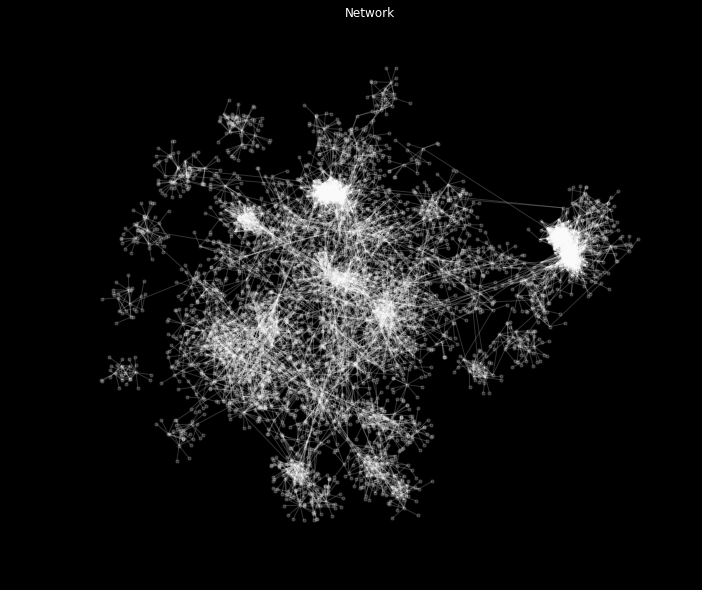

In [268]:
# new function with comments
sf_bp_5_200_new = safe_test_plot(input_network_file, input_attribute_file, nerbor_radius=0.05, min_neighbor=10)

In [269]:
sf_bp_5_200_new.attributes

,id,name,num_neighborhoods_enriched
0,0,GO:0000002 mitochondrial genome maintenance,11.0
1,1,GO:0000012 single strand break repair,0.0
2,2,GO:0000018 regulation of DNA recombination,0.0
3,3,GO:0000027 ribosomal large subunit assembly,0.0
4,4,GO:0000028 ribosomal small subunit assembly,0.0
5,5,GO:0000038 very long-chain fatty acid metaboli...,1.0
6,6,GO:0000041 transition metal ion transport,0.0
7,7,GO:0000045 autophagosome assembly,37.0
8,8,GO:0000050 urea cycle,0.0
9,9,GO:0000054 ribosomal subunit export from nucleus,0.0


Loading network from /Users/zhangxiang/Downloads/Research_CB/GIN/safepy_network_annotation/knn_043_k35.cys
Loading the cys file /Users/zhangxiang/Downloads/Research_CB/GIN/safepy_network_annotation/knn_043_k35.cys...
Loading the first view: CytoscapeSession-2021_05_12-15_17/views/68851-83807-043_knn35_minpcc01.xgmml
Loading the first network: CytoscapeSession-2021_05_12-15_17/networks/68835-expanded_knn_network.xgmml
Calculating edge lengths...
Loading attributes from /Users/zhangxiang/Downloads/Research_CB/GIN/safepy_network_annotation/safe_go_matrix_output/GO_BP_5_200/go_p_matrix_5_200_updated.txt

Attribute data provided: 19719 labels x 5972 attributes
A0A087WT57, A0A087WUV0, A0A087WVE0 and 15970 other labels in the attribute file were not found in the network.

Attribute data mapped onto the network: 3746 labels x 5972 attributes
Values: 1558692 NaNs
Values: 22322182 zeros
Values: 48930 positives
Values: 0 negatives
Node distance metric: euclidean
Neighborhood definition: 0.05 x di

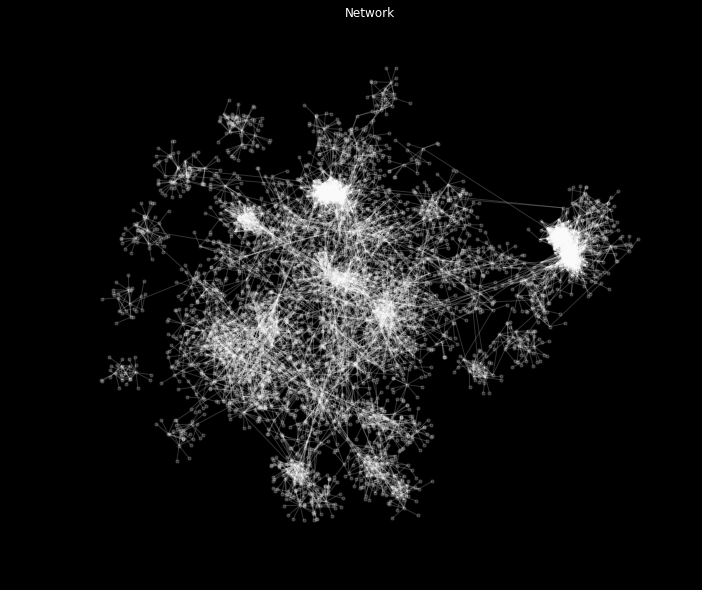

In [235]:
sf_bp_5_200 = safe_test_plot(input_network_file, input_attribute_file, nerbor_radius=0.05, min_neighbor=10)

In [264]:
sf_bp_5_200.attributes

,id,name,num_neighborhoods_enriched,top,num_connected_components,size_connected_components,num_large_connected_components,domain
0,0,GO:0000002 mitochondrial genome maintenance,11.0,False,8,"[2, 2, 2, 1, 1, 1, 1, 1]",0,0
1,1,GO:0000012 single strand break repair,0.0,False,0,None,0,0
2,2,GO:0000018 regulation of DNA recombination,0.0,False,0,None,0,0
3,3,GO:0000027 ribosomal large subunit assembly,0.0,False,0,None,0,0
4,4,GO:0000028 ribosomal small subunit assembly,0.0,False,0,None,0,0
5,5,GO:0000038 very long-chain fatty acid metaboli...,1.0,False,0,None,0,0
6,6,GO:0000041 transition metal ion transport,0.0,False,0,None,0,0
7,7,GO:0000045 autophagosome assembly,37.0,False,17,"[19, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,...",1,0
8,8,GO:0000050 urea cycle,0.0,False,0,None,0,0
9,9,GO:0000054 ribosomal subunit export from nucleus,0.0,False,0,None,0,0


In [266]:
sf_bp_5_200.node2attribute

array([[ 0.,  0.,  0., ...,  0.,  0.,  1.],
       [ 0.,  0.,  0., ...,  0.,  0.,  1.],
       [ 0.,  0.,  0., ...,  0.,  0.,  1.],
       ...,
       [ 0.,  0.,  0., ...,  0.,  0.,  1.],
       [ 0.,  0.,  0., ...,  0.,  0.,  1.],
       [nan, nan, nan, ..., nan, nan, nan]], dtype=float32)

In [285]:
# Test with NGR data - does not work well
input_network_file = expanduser('~') + '/Downloads/Research_CB/GIN/safepy_network_annotation/knn_043_k35.cys'
input_attribute_file = '/Users/zhangxiang/Downloads/Research_CB/GIN/safepy_network_annotation/safe-data/attributes/subcellular_8927genes_06022021.txt'

Loading network from /Users/zhangxiang/Downloads/Research_CB/GIN/safepy_network_annotation/knn_043_k35.cys
Loading the cys file /Users/zhangxiang/Downloads/Research_CB/GIN/safepy_network_annotation/knn_043_k35.cys...
Loading the first view: CytoscapeSession-2021_05_12-15_17/views/68851-83807-043_knn35_minpcc01.xgmml
Loading the first network: CytoscapeSession-2021_05_12-15_17/networks/68835-expanded_knn_network.xgmml
Calculating edge lengths...
Loading attributes from /Users/zhangxiang/Downloads/Research_CB/GIN/safepy_network_annotation/safe-data/attributes/subcellular_8927genes_06022021.txt

Attribute data provided: 8927 labels x 12 attributes
TSPAN6, SCYL3, FGR and 6300 other labels in the attribute file were not found in the network.

Attribute data mapped onto the network: 2624 labels x 12 attributes
Values: 16596 NaNs
Values: 27672 zeros
Values: 3816 positives
Values: 0 negatives
Node distance metric: shortpath_weighted_layout
Neighborhood definition: 0.30 x diameter
Number of nod

ValueError: The number of observations cannot be determined on an empty distance matrix.

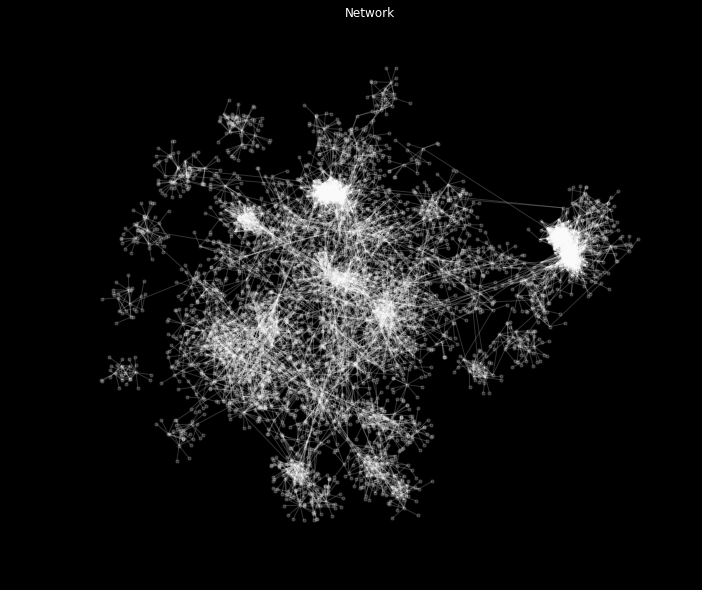

In [286]:
sf_ngr_8927 = safe_test_plot(input_network_file, input_attribute_file, nerbor_radius=0.3, min_neighbor=2, enrichment_threshold=0.5)

In [255]:
sf_ngr_8927.attributes

,id,name,num_neighborhoods_enriched
0,0,Actin Cytoskeleton,442.0
1,1,Aggresome,0.0
2,2,Cell Junctions/Plasma Membrane,522.0
3,3,Cytokinetic Bridge,0.0
4,4,Cytosol/Cytoplasmic Bodies,249.0
5,5,ER-Golgi-Vesicles,987.0
6,6,Intermediate Filaments,1.0
7,7,Lipid Droplets,105.0
8,8,Microtubule Cytoskeleton,122.0
9,9,Mitochondria,445.0


In [257]:
sf_ngr_8927.node2attribute.shape

(4007, 12)

In [61]:
# Next, try the other subcellular localization data, which needs some adjustment  - one hot encoding
# Let's start with OpenCell
df_opencell_loc = pd.read_csv('/Users/zhangxiang/Downloads/Research_CB/GIN/new_feature_collection/OpenCell/sub_localization.csv', index_col=0)

In [62]:
df_opencell_loc

,Ensembl_gene_ID,graded_annotation
target_name,,
AAMP,ENSG00000127837,"['cytoplasmic_3', 'nucleoplasm_1']"
AATF,ENSG00000275700,['nucleolus_gc_3']
ABCE1,ENSG00000164163,"['cytoplasmic_3', 'nucleoplasm_1', 'vesicles_2']"
ABR,ENSG00000278741,"['cytoplasmic_3', 'vesicles_2']"
ACAP2,ENSG00000114331,['cytoplasmic_3']
ACAP3,ENSG00000131584,"['mitochondria_2', 'cytoplasmic_3']"
ACLY,ENSG00000131473,"['cytoplasmic_3', 'nucleoplasm_2']"
ACTB,ENSG00000075624,"['membrane_3', 'cytoskeleton_3', 'cytoplasmic_2']"
ACTG1,ENSG00000184009,"['membrane_3', 'cytoplasmic_1', 'cytoskeleton_3']"


In [77]:
df_opencell_loc['graded_annotation'] = df_opencell_loc['graded_annotation'].str.replace(r'[', '').str.replace(r']', '')

In [85]:
df_opencell_loc['graded_annotation'] = df_opencell_loc['graded_annotation'].str.replace(r"'", '')

In [100]:
df_opencell_loc['graded_annotation'][df_opencell_loc['graded_annotation'].isnull()]

target_name
SARS1    NaN
Name: graded_annotation, dtype: object

In [102]:
df_opencell_loc = df_opencell_loc.drop(index='SARS1')

In [111]:
l_0 = df_opencell_loc['graded_annotation'].str.split(', ').values.tolist()[0]
for l in df_opencell_loc['graded_annotation'].str.split(', ').values.tolist()[1:]:
    l_0 = l_0 + l
    

In [114]:
'' in l_0

True

In [118]:
# CTPS1 - 'interesting'
# DDX6, LSM14A, RND3, ATP6V0E1 - []
len(set(l_0))-2

58

In [127]:
unique_terms = set(l_0)

In [128]:
unique_terms.remove('interesting') 

In [129]:
unique_terms.remove('')

In [131]:
len(unique_terms)

58

In [140]:
df_opencell_loc_1305 = df_opencell_loc.drop(index=['CTPS1', 'DDX6', 'LSM14A', 'RND3', 'ATP6V0E1'])

In [141]:
df_opencell_loc_1305

,Ensembl_gene_ID,graded_annotation
target_name,,
AAMP,ENSG00000127837,"cytoplasmic_3, nucleoplasm_1"
AATF,ENSG00000275700,nucleolus_gc_3
ABCE1,ENSG00000164163,"cytoplasmic_3, nucleoplasm_1, vesicles_2"
ABR,ENSG00000278741,"cytoplasmic_3, vesicles_2"
ACAP2,ENSG00000114331,cytoplasmic_3
ACAP3,ENSG00000131584,"mitochondria_2, cytoplasmic_3"
ACLY,ENSG00000131473,"cytoplasmic_3, nucleoplasm_2"
ACTB,ENSG00000075624,"membrane_3, cytoskeleton_3, cytoplasmic_2"
ACTG1,ENSG00000184009,"membrane_3, cytoplasmic_1, cytoskeleton_3"


In [147]:
df_opencell_loc_1305.to_csv('/Users/zhangxiang/Downloads/Research_CB/GIN/new_feature_collection/OpenCell/sub_localization_1305.csv')

In [144]:
df_open_loc_1305_58term = pd.DataFrame(np.zeros([1305,58]))

In [145]:
df_open_loc_1305_58term.index = df_opencell_loc_1305.index
df_open_loc_1305_58term.columns = list(unique_terms)

In [146]:
df_open_loc_1305_58term

,centrosome_3,vesicles_1,cilia_3,cytoskeleton_3,cytoplasmic_3,vesicles_2,nucleoplasm_2,cell_contact_3,chromatin_1,er_2,...,nucleoplasm_3,cytoskeleton_2,textured,cytoplasmic_2,mitochondria_2,nucleus_cytoplasm_variation_3,nuclear_punctae_1,cytoskeleton_1,nucleolar_ring_3,nucleoplasm_1
target_name,,,,,,,,,,,,,,,,,,,,,
AAMP,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
AATF,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
ABCE1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
ABR,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
ACAP2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
ACAP3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
ACLY,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
ACTB,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
ACTG1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [150]:
# fill in the corresponding entries
for row in df_opencell_loc_1305.iterrows():
    annos = row[1]['graded_annotation']
    annos_list = annos.split(', ')
    for i in annos_list:
        df_open_loc_1305_58term.loc[row[0]][i] = 1

In [154]:
df_open_loc_1305_58term.to_csv('/Users/zhangxiang/Downloads/Research_CB/GIN/new_feature_collection/OpenCell/sub_localization_1305_annotation.txt', sep='\t')

In [218]:
# Next, try with this localization file
input_network_file = expanduser('~') + '/Downloads/Research_CB/GIN/safepy_network_annotation/knn_043_k35.cys'
input_attribute_file = '/Users/zhangxiang/Downloads/Research_CB/GIN/safepy_network_annotation/safe-data/attributes/sub_localization_1305_annotation.txt'

Loading network from /Users/zhangxiang/Downloads/Research_CB/GIN/safepy_network_annotation/knn_043_k35.cys
Loading the cys file /Users/zhangxiang/Downloads/Research_CB/GIN/safepy_network_annotation/knn_043_k35.cys...
Loading the first view: CytoscapeSession-2021_05_12-15_17/views/68851-83807-043_knn35_minpcc01.xgmml
Loading the first network: CytoscapeSession-2021_05_12-15_17/networks/68835-expanded_knn_network.xgmml
Calculating edge lengths...
Loading attributes from /Users/zhangxiang/Downloads/Research_CB/GIN/safepy_network_annotation/safe-data/attributes/sub_localization_1305_annotation.txt

Attribute data provided: 1305 labels x 58 attributes
AAMP, AATF, ABCE1 and 756 other labels in the attribute file were not found in the network.

Attribute data mapped onto the network: 546 labels x 58 attributes
Values: 200738 NaNs
Values: 30541 zeros
Values: 1127 positives
Values: 0 negatives
Node distance metric: euclidean
Neighborhood definition: 0.30 x diameter
Number of nodes per neighborh

ValueError: The number of observations cannot be determined on an empty distance matrix.

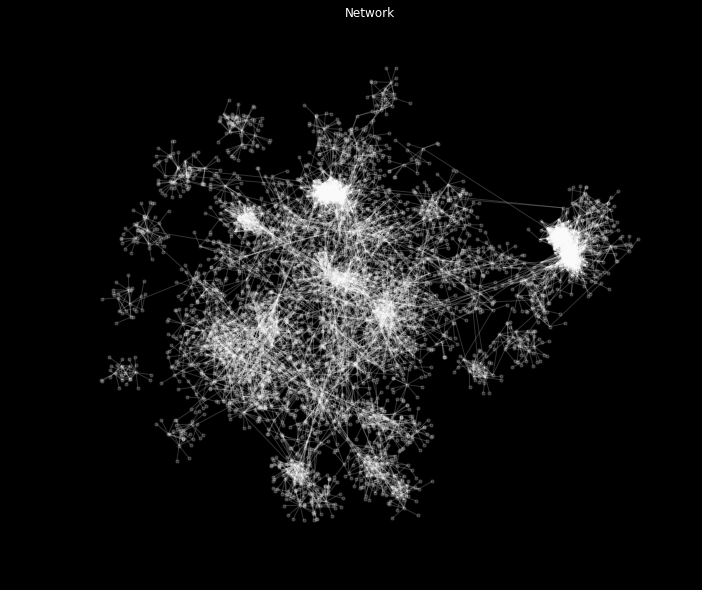

In [219]:
sf_opencell_1305 = safe_test_plot(input_network_file, input_attribute_file, nerbor_radius=0.3, min_neighbor=2)

In [159]:
# Try with a merged version - later
df_open_loc_1305_58term.columns

Index(['centrosome_3', 'vesicles_1', 'cilia_3', 'cytoskeleton_3',
       'cytoplasmic_3', 'vesicles_2', 'nucleoplasm_2', 'cell_contact_3',
       'chromatin_1', 'er_2', 'centrosome_2', 'nuclear_punctae_2',
       'cell_contact_1', 'nuclear_membrane_2', 'nucleolar_ring_1',
       'nucleoplasm', 'focal_adhesions_3', 'er_1', 'nucleolus_gc_3',
       'chromatin_2', 'textured_2', 'nuclear_membrane_1', 'nuclear_1',
       'nucleolus_gc_2', 'vesicles_3', 'rare_gfp', 'textured_3',
       'cell_contact_2', 'nuclear_membrane_3', 'membrane_2',
       'nucleolus_fc_dfc_1', 'nucleolus_gc_1', 'golgi_3', 'golgi_2',
       'focal_adhesions_2', 'membrane_3', 'nucleolus_fc_dfc_2', 'er_3',
       'focal_adhesions_1', 'chromatin_3', 'centrosome_1', 'membrane_1',
       'cytoplasmic_1', 'nuclear_punctae_3', 'nucleolar_ring_2', 'golgi_1',
       'nucleolus_fc_dfc_3', 'mitochondria_3', 'nucleoplasm_3',
       'cytoskeleton_2', 'textured', 'cytoplasmic_2', 'mitochondria_2',
       'nucleus_cytoplasm_variation

In [168]:
# Finally, try with the localization feature data that we originally collected
# Use the integration feature by 06/02/2021
df_allfeatures = pd.read_csv('/Users/zhangxiang/Downloads/Research_CB/GIN/new_feature_collection/Integration_features_combined.txt',sep='\t',index_col=0)

In [172]:
df_sub_17808 = df_allfeatures[['subcellular_location']]

In [184]:
ll_0 = []
for ll in df_sub_17808['subcellular_location'].str.split(';').values.tolist():
    if ll is np.nan:
        continue
    else:
        ll_0 = ll_0 + ll
    

In [188]:
len(set(ll_0))

35

In [189]:
df_sub_loc_17808_35term = pd.DataFrame(np.zeros([17808,35]))
df_sub_loc_17808_35term.index = df_sub_17808.index
df_sub_loc_17808_35term.columns = list(set(ll_0))

In [193]:
df_sub_loc_17808_35term[df_sub_loc_17808_35term.index.duplicated()]

,Plasma membrane,Cytosol,Microtubules,Golgi apparatus,Cytokinetic bridge,Aggresome,Nucleoli,Cleavage furrow,Nucleoli rim,Nucleoli fibrillar center,...,Peroxisomes,Vesicles,Nuclear speckles,Cell Junctions,Focal adhesion sites,Nucleoplasm,Actin filaments,Endoplasmic reticulum,Kinetochore,Nuclear bodies
gene,,,,,,,,,,,,,,,,,,,,,
HBD,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
MEMO1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
MMD2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
TEC,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [199]:
# remove duplicates
df_sub_loc_17800_35term = df_sub_loc_17808_35term.drop(index = df_sub_loc_17808_35term[df_sub_loc_17808_35term.index.duplicated()].index)

In [200]:
df_sub_loc_17800_35term

,Plasma membrane,Cytosol,Microtubules,Golgi apparatus,Cytokinetic bridge,Aggresome,Nucleoli,Cleavage furrow,Nucleoli rim,Nucleoli fibrillar center,...,Peroxisomes,Vesicles,Nuclear speckles,Cell Junctions,Focal adhesion sites,Nucleoplasm,Actin filaments,Endoplasmic reticulum,Kinetochore,Nuclear bodies
gene,,,,,,,,,,,,,,,,,,,,,
A1BG,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
A1CF,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
A2M,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
A2ML1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
A3GALT2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
A4GALT,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
A4GNT,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
AAAS,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
AACS,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [201]:
df_sub_17800 = df_sub_17808.drop(index = df_sub_loc_17808_35term[df_sub_loc_17808_35term.index.duplicated()].index)

In [203]:
# fill in the corresponding entries
for row in df_sub_17800.iterrows():
    annos = row[1]['subcellular_location']
    if annos is np.nan:
        continue
    else:
        annos_list = annos.split(';')
        for i in annos_list:
            df_sub_loc_17800_35term.loc[row[0]][i] = 1

In [208]:
df_sub_loc_17800_35term.to_csv('/Users/zhangxiang/Downloads/Research_CB/GIN/new_feature_collection/sub_localization_17800_annotation.txt', sep='\t')

In [258]:
# Next, try with this localization file
input_network_file = expanduser('~') + '/Downloads/Research_CB/GIN/safepy_network_annotation/knn_043_k35.cys'
input_attribute_file = '/Users/zhangxiang/Downloads/Research_CB/GIN/safepy_network_annotation/safe-data/attributes/sub_localization_17800_annotation.txt'

Loading network from /Users/zhangxiang/Downloads/Research_CB/GIN/safepy_network_annotation/knn_043_k35.cys
Loading the cys file /Users/zhangxiang/Downloads/Research_CB/GIN/safepy_network_annotation/knn_043_k35.cys...
Loading the first view: CytoscapeSession-2021_05_12-15_17/views/68851-83807-043_knn35_minpcc01.xgmml
Loading the first network: CytoscapeSession-2021_05_12-15_17/networks/68835-expanded_knn_network.xgmml
Calculating edge lengths...
Loading attributes from /Users/zhangxiang/Downloads/Research_CB/GIN/safepy_network_annotation/safe-data/attributes/sub_localization_17800_annotation.txt

Attribute data provided: 17800 labels x 35 attributes
A1CF, A2M, A2ML1 and 13791 other labels in the attribute file were not found in the network.

Attribute data mapped onto the network: 4006 labels x 35 attributes
Values: 35 NaNs
Values: 136316 zeros
Values: 3894 positives
Values: 0 negatives
Node distance metric: euclidean
Neighborhood definition: 0.50 x diameter
Number of nodes per neighbor

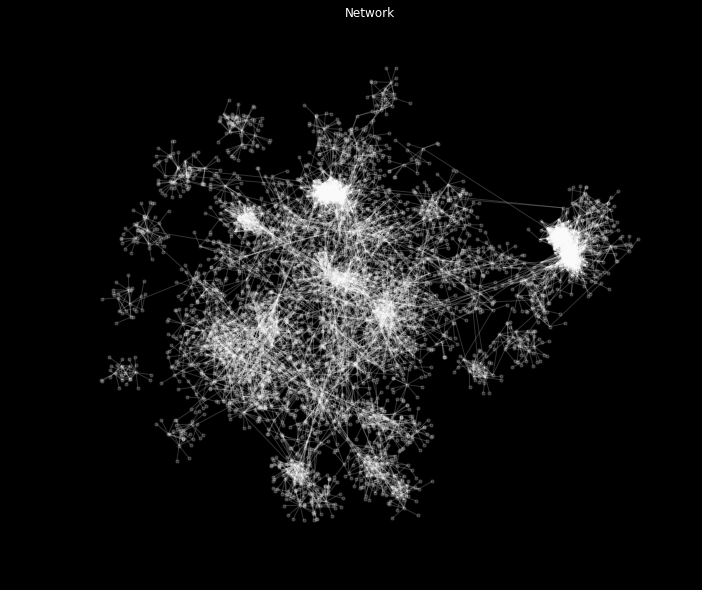

In [259]:
# new function with comments
sf_sub_17800 = safe_test_plot(input_network_file, input_attribute_file, nerbor_radius=0.5, min_neighbor=2)

In [263]:
sf_sub_17800.attributes

,id,name,num_neighborhoods_enriched
0,0,Plasma membrane,1005.0
1,1,Cytosol,1613.0
2,2,Microtubules,5.0
3,3,Golgi apparatus,1427.0
4,4,Cytokinetic bridge,0.0
5,5,Aggresome,0.0
6,6,Nucleoli,1161.0
7,7,Cleavage furrow,0.0
8,8,Nucleoli rim,167.0
9,9,Nucleoli fibrillar center,6.0


In [262]:
sf_sub_17800.node2attribute

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 1., 0., ..., 0., 0., 0.],
       [0., 1., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]], dtype=float32)

Loading network from /Users/zhangxiang/Downloads/Research_CB/GIN/safepy_network_annotation/knn_043_k35.cys
Loading the cys file /Users/zhangxiang/Downloads/Research_CB/GIN/safepy_network_annotation/knn_043_k35.cys...
Loading the first view: CytoscapeSession-2021_05_12-15_17/views/68851-83807-043_knn35_minpcc01.xgmml
Loading the first network: CytoscapeSession-2021_05_12-15_17/networks/68835-expanded_knn_network.xgmml
Calculating edge lengths...
Loading attributes from /Users/zhangxiang/Downloads/Research_CB/GIN/safepy_network_annotation/safe-data/attributes/sub_localization_17800_annotation.txt

Attribute data provided: 17800 labels x 35 attributes
A1CF, A2M, A2ML1 and 13791 other labels in the attribute file were not found in the network.

Attribute data mapped onto the network: 4006 labels x 35 attributes
Values: 35 NaNs
Values: 136316 zeros
Values: 3894 positives
Values: 0 negatives
Node distance metric: euclidean
Neighborhood definition: 0.50 x diameter
Number of nodes per neighbor

ValueError: The number of observations cannot be determined on an empty distance matrix.

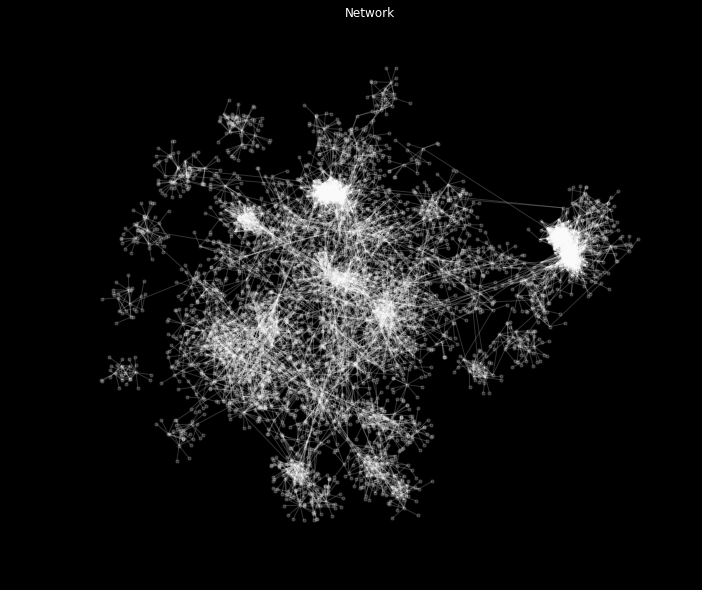

In [223]:
sf_sub_17800 = safe_test_plot(input_network_file, input_attribute_file, nerbor_radius=0.5, min_neighbor=2)

In [226]:
df_sub_loc_17800_35term.sum()

Plasma membrane              1316.0
Cytosol                      2729.0
Microtubules                  178.0
Golgi apparatus               742.0
Cytokinetic bridge             23.0
Aggresome                       3.0
Nucleoli                      552.0
Cleavage furrow                 1.0
Nucleoli rim                  122.0
Nucleoli fibrillar center     174.0
Mitochondria                  897.0
Midbody ring                    4.0
Nuclear membrane              167.0
Centriolar satellite           82.0
Midbody                        15.0
Cytoplasmic bodies             39.0
Lipid droplets                 25.0
Endosomes                      16.0
Intermediate filaments        113.0
Lysosomes                      19.0
Microtubule ends                3.0
Centrosome                    191.0
Mitotic chromosome             28.0
Mitotic spindle                20.0
Rods & Rings                    5.0
Peroxisomes                    22.0
Vesicles                     1355.0
Nuclear speckles            

In [227]:
# Compare with previous annotation files
# load attribute with go_p_matrix_5_200_updated.txt --- BP
df_p_5_200 = pd.read_csv('/Users/zhangxiang/Downloads/Research_CB/GIN/safepy_network_annotation/safe_go_matrix_output/GO_BP_5_200/go_p_matrix_5_200_updated.txt', index_col=0, sep='\t')

In [229]:
df_p_5_200.sum()

GO:0000002 mitochondrial genome maintenance                                                                          11
GO:0000012 single strand break repair                                                                                11
GO:0000018 regulation of DNA recombination                                                                            8
GO:0000027 ribosomal large subunit assembly                                                                          27
GO:0000028 ribosomal small subunit assembly                                                                          15
GO:0000038 very long-chain fatty acid metabolic process                                                              16
GO:0000041 transition metal ion transport                                                                            41
GO:0000045 autophagosome assembly                                                                                    61
GO:0000050 urea cycle                   

In [57]:
# print output
import os
from pathlib import Path
output_dir = expanduser('~') + '/Downloads/Research_CB/GIN/safepy_network_annotation'
input_stem = Path(input_file).stem
output_file_dir = os.path.join(output_dir, input_stem)
if not os.path.exists(output_file_dir):
    os.makedirs(output_file_dir)

Output path: /Users/zhangxiang/Downloads/Research_CB/GIN/safepy_network_annotation/043_organic_GMO_circle_viz.pdf


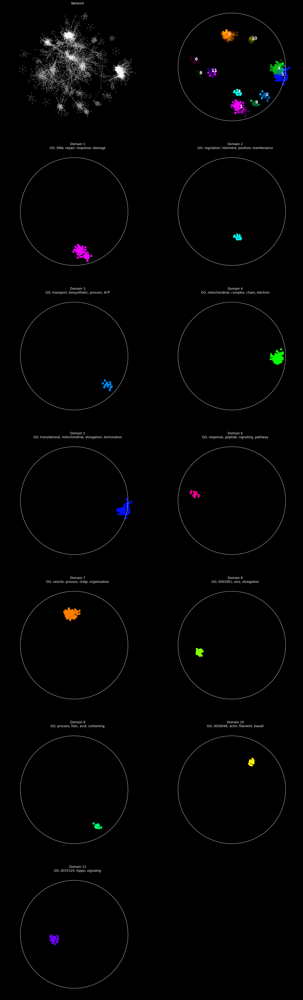

In [58]:
sf.plot_composite_network(show_each_domain=True, save_fig='{output_dir}/{input_file}_viz.pdf'.format(output_dir=output_dir, input_file=input_stem))

Output path: /Users/zhangxiang/Downloads/Research_CB/GIN/safepy_network_annotation/top_043_organic_GMO_circle_viz.pdf


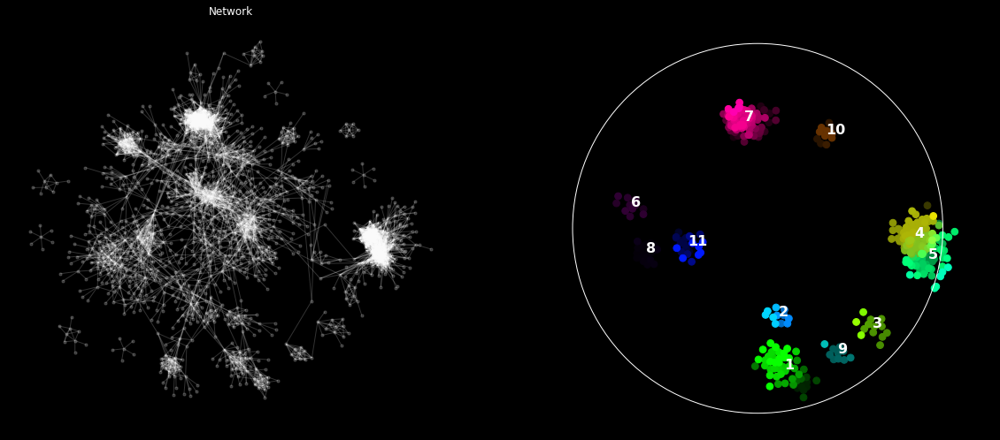

In [59]:
sf.plot_composite_network(show_each_domain=False, save_fig='{output_dir}/top_{input_file}_viz.pdf'.format(output_dir=output_dir, input_file=input_stem))

In [60]:
sf.print_output_files(output_dir=output_file_dir)

/Users/zhangxiang/Downloads/Research_CB/GIN/safepy_network_annotation/043_organic_GMO_circle/domain_properties_annotation.txt
/Users/zhangxiang/Downloads/Research_CB/GIN/safepy_network_annotation/043_organic_GMO_circle/attribute_properties_annotation.txt
/Users/zhangxiang/Downloads/Research_CB/GIN/safepy_network_annotation/043_organic_GMO_circle/node_properties_annotation.txt


In [61]:
sf.save_network(output_file=os.path.join(output_file_dir, input_stem + ".gpickle"))

In [137]:
# Temporary work for C. alb
df_NE_5984 = pd.read_csv('/Users/zhangxiang/Downloads/Research_CB/GeneEssentiality_CandidaAlbicans/non_ess_5984.csv', sep=',', index_col=0)

In [138]:
df_NE_5984

,Gene expression level,Gene expression variance,Co-expression degree,CAI,Sequence variation,Synthetic sick/lethal paralogs in S. cerevisiae,Ortholog essentiality in S. cerevisiae,Length,Hits,Reads,Freedom index,Neighborhood index,Upstream hits 100,GRACE (1: E; -1 NE),GRACEv2 (1: E; -1 NE),RF prediction (1: E; -1 NE),RF prediction score,Unnamed: 18,Unnamed: 19
Feature name,,,,,,,,,,,,,,,,,,,
CR_10650W_A,45.15,1.018725e+04,271.0,0.21,0.000000,-1,-1,1152.0,4.0,6.0,0.373264,0.075576,7.0,-1.0,-1.0,-1,0.235000,NaN,NaN
C2_04930C_A,23.22,4.034566e+03,0.0,0.14,0.000894,0,1,2238.0,22.0,2309.0,0.462020,0.218236,0.0,-1.0,-1.0,-1,0.233424,NaN,NaN
C6_03400C_A,394.90,1.936300e+05,46.0,0.26,0.000000,-1,-1,384.0,1.0,55.0,0.713542,0.034389,6.0,-1.0,-1.0,-1,0.220497,NaN,NaN
C4_06270C_A,67.61,2.766131e+03,0.0,0.18,0.002852,0,1,1053.0,6.0,85.0,0.254511,0.062481,18.0,-1.0,-1.0,-1,0.219443,NaN,NaN
C3_03520C_A,159.34,3.209903e+04,4.0,0.28,0.002649,-1,-1,756.0,25.0,1185.0,0.170635,0.187828,17.0,-1.0,-1.0,-1,0.001975,NaN,NaN
C4_03740W_A,32.67,2.209393e+03,308.0,0.14,0.003282,0,1,915.0,2.0,18.0,0.512568,0.017789,0.0,-1.0,NaN,-1,0.498594,NaN,NaN
C1_03600W_A,74.30,4.824060e+03,18.0,0.19,0.001209,0,1,828.0,0.0,0.0,1.000000,0.000000,0.0,-1.0,NaN,-1,0.497297,NaN,NaN
C6_02590C_A,50.58,1.293214e+04,0.0,0.16,0.002436,0,1,822.0,1.0,19.0,0.990268,0.012784,1.0,-1.0,NaN,-1,0.494852,NaN,NaN
CR_03740C_A,63.69,3.727317e+04,20.0,0.17,0.003774,0,1,531.0,0.0,0.0,1.000000,0.000000,1.0,-1.0,NaN,-1,0.489657,NaN,NaN


In [91]:
df_hets = pd.read_csv('/Users/zhangxiang/Downloads/Research_CB/GeneEssentiality_CandidaAlbicans/hets_to_make.csv', header=None, sep=',', index_col=1)

In [92]:
df_hets

,0,2,3,4,5,6,7
1,,,,,,,
CR_05270W_A,orf19.1008,NaN,NaN,CAL0000185952,Ortholog of Candida albicans WO-1 : CAWG_01856,NaN,NaN
C1_03840W_A,orf19.1026.1,NaN,NaN,CAL0000182429,"Ortholog of C. dubliniensis CD36 : Cd36_03580,...",NaN,NaN
C1_03820W_A,orf19.1027,PDR16,PDR16,CAL0000191119,Phosphatidylinositol transfer protein; inducti...,NaN,NaN
C1_04150C_A,orf19.1049,NaN,NaN,CAL0000194890,Predicted NUDIX hydrolase domain; Hap43-induced,NaN,NaN
C1_04160C_A,orf19.1050,YMR087W,NaN,CAL0000175962,"Ortholog of S. cerevisiae : YMR087W, C. glabra...",NaN,NaN
C1_04240C_A,orf19.1059,HHF1,HHF1,CAL0000174606,Putative histone H4; repressed in fkh2 mutant;...,NaN,NaN
C1_04260W_A,orf19.1061,NaN,HHT21,CAL0000180612,Putative histone H3; amphotericin B repressed;...,NaN,NaN
C1_04300C_A,orf19.1065,SSA2,SSA2,CAL0000184853,HSP70 family chaperone; cell wall fractions; a...,NaN,NaN
C6_04200C_A,orf19.1075.1,NaN,NaN,CAL0000176985,Pseudogene; added to Assembly 21 based on comp...,NaN,NaN


In [145]:
np.intersect1d(df_NE_5984.index, df_hets.index).shape

(1122,)

In [149]:
set(df_hets.index)-set(np.intersect1d(df_NE_5984.index, df_hets.index))

{'C1_03590W_A',
 'C1_06450C_A',
 'C1_06890C_A',
 'C2_01810W_A',
 'C2_02430W_A',
 'C2_03650W_A',
 'C2_03880C_A',
 'C2_06360C_A',
 'C2_08410C_A',
 'C3_01490W_A',
 'C4_03240C_A',
 'C5_01600C_A',
 'C5_01870W_A',
 'C5_02490C_A',
 'C5_03920C_A',
 'C6_00040W_A',
 'C7_02900W_A',
 'CR_06280W_A',
 'CR_08480C_A'}

In [150]:
# Map ORFs for 6638 gens
df_supp1 = pd.read_csv('/Users/zhangxiang/Downloads/Research_CB/GeneEssentiality_CandidaAlbicans/data/SupplementaryData1_06012021.csv', sep=',', index_col=0)

In [151]:
df_supp1

,Gene expression level,Gene expression variance,Co-expression degree,CAI,Sequence variation,Synthetic sick/lethal paralogs in S. cerevisiae,Ortholog essentiality in S. cerevisiae,Length,Hits,Reads,Freedom index,Neighborhood index,Upstream hits 100,GRACE (1: E; -1 NE),GRACEv2 (1: E; -1 NE),RF prediction (1: E; -1 NE),RF prediction score
Feature name,,,,,,,,,,,,,,,,,
C5_00150C_A,140.81,12955.626680,2.0,0.23,0.001839,0,1,1632.0,4.0,318.0,0.641544,0.046053,3.0,1.0,NaN,1,0.950776
CR_09950C_A,321.46,155507.033300,194.0,0.36,0.001935,0,1,1551.0,3.0,27.0,0.646035,0.037371,0.0,1.0,NaN,1,0.946423
CR_01760C_A,233.34,39110.920380,164.0,0.29,0.000562,0,1,1779.0,2.0,2.0,0.574480,0.022820,0.0,1.0,NaN,1,0.939182
C5_00660C_A,150.71,42857.805580,1.0,0.30,0.001261,0,1,1587.0,4.0,249.0,0.511657,0.033746,0.0,1.0,NaN,1,0.930768
C1_01530C_A,167.08,17908.754310,231.0,0.36,0.001071,0,1,1869.0,3.0,81.0,0.433387,0.036585,0.0,1.0,NaN,1,0.927117
C6_00370C_A,297.47,100857.535200,194.0,0.36,0.003226,0,1,1551.0,3.0,58.0,0.934236,0.024496,0.0,1.0,NaN,1,0.927093
C2_03160C_A,159.78,24167.914700,0.0,0.41,0.002340,0,1,2565.0,3.0,5.0,0.881481,0.026733,0.0,1.0,NaN,1,0.926072
C4_06830C_A,126.20,12752.388330,122.0,0.25,0.001787,0,1,1680.0,6.0,506.0,0.429762,0.046735,0.0,1.0,NaN,1,0.925686
C1_02790W_A,264.92,60454.030880,245.0,0.24,0.000000,0,1,1053.0,2.0,3.0,0.946819,0.032617,0.0,1.0,NaN,1,0.922092


In [155]:
df_map = pd.read_csv('/Users/zhangxiang/Downloads/Research_CB/GeneEssentiality_CandidaAlbicans/data/ORF19_Assembly22_mapping.tab', sep='\t', index_col=1)

In [175]:
df_map.loc['CR_10770W_A']

ORF19_ID     orf19.7666
GENE_NAME           NaN
Name: CR_10770W_A, dtype: object

In [158]:
np.intersect1d(df_map.index, df_supp1.index).shape

(6436,)

In [165]:
df_joined_6638 = df_supp1.join(df_map)

In [168]:
df_joined_6436 = df_joined_6638[df_joined_6638['ORF19_ID'].notnull()]

In [173]:
df_joined_6436

,Gene expression level,Gene expression variance,Co-expression degree,CAI,Sequence variation,Synthetic sick/lethal paralogs in S. cerevisiae,Ortholog essentiality in S. cerevisiae,Length,Hits,Reads,Freedom index,Neighborhood index,Upstream hits 100,GRACE (1: E; -1 NE),GRACEv2 (1: E; -1 NE),RF prediction (1: E; -1 NE),RF prediction score,ORF19_ID,GENE_NAME
Feature name,,,,,,,,,,,,,,,,,,,
C5_00150C_A,140.81,12955.626680,2.0,0.23,0.001839,0,1,1632.0,4.0,318.0,0.641544,0.046053,3.0,1.0,NaN,1,0.950776,orf19.5682,NaN
CR_09950C_A,321.46,155507.033300,194.0,0.36,0.001935,0,1,1551.0,3.0,27.0,0.646035,0.037371,0.0,1.0,NaN,1,0.946423,orf19.7569,SIK1
CR_01760C_A,233.34,39110.920380,164.0,0.29,0.000562,0,1,1779.0,2.0,2.0,0.574480,0.022820,0.0,1.0,NaN,1,0.939182,orf19.2573,FRS1
C5_00660C_A,150.71,42857.805580,1.0,0.30,0.001261,0,1,1587.0,4.0,249.0,0.511657,0.033746,0.0,1.0,NaN,1,0.930768,orf19.922,ERG11
C1_01530C_A,167.08,17908.754310,231.0,0.36,0.001071,0,1,1869.0,3.0,81.0,0.433387,0.036585,0.0,1.0,NaN,1,0.927117,orf19.3341,NaN
C6_00370C_A,297.47,100857.535200,194.0,0.36,0.003226,0,1,1551.0,3.0,58.0,0.934236,0.024496,0.0,1.0,NaN,1,0.927093,orf19.1199,NOP5
C2_03160C_A,159.78,24167.914700,0.0,0.41,0.002340,0,1,2565.0,3.0,5.0,0.881481,0.026733,0.0,1.0,NaN,1,0.926072,orf19.5779,RNR1
C4_06830C_A,126.20,12752.388330,122.0,0.25,0.001787,0,1,1680.0,6.0,506.0,0.429762,0.046735,0.0,1.0,NaN,1,0.925686,orf19.3126,CCT6
C1_02790W_A,264.92,60454.030880,245.0,0.24,0.000000,0,1,1053.0,2.0,3.0,0.946819,0.032617,0.0,1.0,NaN,1,0.922092,orf19.2967,TIF34


In [174]:
df_joined_6436.to_csv('/Users/zhangxiang/Downloads/Research_CB/GeneEssentiality_CandidaAlbicans/data/SupplementaryData1_revised_6436_ORFs_06012021.csv')

In [86]:
# test with overlap ORFs again
df_joined_6436 = pd.read_csv('/Users/zhangxiang/Downloads/Research_CB/GeneEssentiality_CandidaAlbicans/data/SupplementaryData1_revised_6436_ORFs_06012021.csv',index_col=0)

In [89]:
df_joined_5782 = df_joined_6436[df_joined_6436['RF prediction (1: E; -1 NE)']==-1]

In [90]:
df_joined_5782

,Gene expression level,Gene expression variance,Co-expression degree,CAI,Sequence variation,Synthetic sick/lethal paralogs in S. cerevisiae,Ortholog essentiality in S. cerevisiae,Length,Hits,Reads,Freedom index,Neighborhood index,Upstream hits 100,GRACE (1: E; -1 NE),GRACEv2 (1: E; -1 NE),RF prediction (1: E; -1 NE),RF prediction score,ORF19_ID,GENE_NAME
Feature name,,,,,,,,,,,,,,,,,,,
C1_07910C_A,44.85,8.580144e+03,294.0,0.18,0.002471,-1,-1,1215.0,0.0,0.0,1.000000,0.000000,0.0,1.0,NaN,-1,0.499965,orf19.5064,MRPL3
C6_02120W_A,79.45,5.649974e+03,13.0,NaN,0.001808,-1,-1,4980.0,13.0,190.0,0.277912,0.033920,0.0,1.0,NaN,-1,0.499471,orf19.3496,CHC1
C2_07260C_A,159.71,8.056382e+04,3.0,0.19,0.002273,0,0,441.0,0.0,0.0,1.000000,0.000000,0.0,1.0,NaN,-1,0.499390,orf19.2283,DQD1
C4_03740W_A,32.67,2.209393e+03,308.0,0.14,0.003282,0,1,915.0,2.0,18.0,0.512568,0.017789,0.0,-1.0,NaN,-1,0.498594,orf19.1304,NaN
C4_01710C_A,304.79,1.059098e+05,9.0,0.17,0.002336,0,0,429.0,1.0,1.0,0.585082,0.043209,0.0,NaN,-1.0,-1,0.498132,orf19.4623,NaN
C1_03600W_A,74.30,4.824060e+03,18.0,0.19,0.001209,0,1,828.0,0.0,0.0,1.000000,0.000000,0.0,-1.0,NaN,-1,0.497297,orf19.3060,NaN
C6_02590C_A,50.58,1.293214e+04,0.0,0.16,0.002436,0,1,822.0,1.0,19.0,0.990268,0.012784,1.0,-1.0,NaN,-1,0.494852,orf19.5528,MOB1
CR_00250W_A,1584.78,4.099957e+06,18.0,0.42,0.002703,-1,-1,371.0,0.0,0.0,1.000000,0.000000,1.0,NaN,NaN,-1,0.494465,orf19.7509.1,ATP17
C3_02840W_A,11.55,6.109544e+02,78.0,0.12,0.001748,0,1,573.0,4.0,95.0,0.455497,0.052164,3.0,1.0,NaN,-1,0.494334,orf19.275,NaN


In [93]:
np.intersect1d(df_joined_5782.index, df_hets.index).shape

(1122,)

In [96]:
df_joined_3220 = df_joined_5782[df_joined_5782['GRACE (1: E; -1 NE)'].isnull() & df_joined_5782['GRACEv2 (1: E; -1 NE)'].isnull()]

In [99]:
np.intersect1d(df_joined_3220.index, df_hets.index).shape

(1121,)

In [100]:
df_NE_3200_NR = pd.read_csv('/Users/zhangxiang/Downloads/Research_CB/GeneEssentiality_CandidaAlbicans/data/SupplementaryData1_revised_3200_ORFs_06022021_NR_nonessential.csv', index_col=0)

In [102]:
np.intersect1d(df_NE_3200_NR.index, df_hets.index).shape

(1121,)

In [103]:
set(df_joined_3220.index) - set(df_NE_3200_NR.index)

{'CM_00030W',
 'CM_00050W',
 'CM_00060W',
 'CM_00070C',
 'CM_00140C',
 'CM_00160C',
 'CM_00170C',
 'CM_00210W',
 'CM_00220W',
 'CM_00230W',
 'CM_00240W',
 'CM_00250W',
 'CM_00310W',
 'CM_00320W',
 'CM_00330W',
 'CM_00340W',
 'CM_00370W',
 'CM_00380W',
 'CM_00440W',
 'CM_00520W'}

In [104]:
set(np.intersect1d(df_joined_5782.index, df_hets.index)) - set(np.intersect1d(df_NE_3200_NR.index, df_hets.index))

{'CR_08700C_A'}

In [105]:
df_joined_5782.loc['CR_08700C_A']

Gene expression level                                   46.62
Gene expression variance                              32396.2
Co-expression degree                                        2
CAI                                                      0.16
Sequence variation                                          0
Synthetic sick/lethal paralogs in S. cerevisiae             0
Ortholog essentiality in S. cerevisiae                      0
Length                                                    540
Hits                                                       16
Reads                                                    1450
Freedom index                                        0.240741
Neighborhood index                                   0.544737
Upstream hits 100                                          12
GRACE (1: E; -1 NE)                                       NaN
GRACEv2 (1: E; -1 NE)                                      -1
RF prediction (1: E; -1 NE)                                -1
RF predi

In [113]:
df_joined_6436.loc[['C1_03590W_A',
 'C1_06450C_A',
 'C1_06890C_A',
 'C2_01810W_A',
 'C2_02430W_A',
 'C2_03650W_A',
 'C2_03880C_A',
 'C2_06360C_A',
 'C2_08410C_A',
 'C3_01490W_A',
 'C4_03240C_A',
 'C5_01600C_A',
 'C5_01870W_A',
 'C5_02490C_A',
 'C5_03920C_A',
 'C6_00040W_A',
 'C7_02900W_A',
 'CR_06280W_A',
 'CR_08480C_A', 'CR_08700C_A']]

/Users/zhangxiang/opt/anaconda3/envs/safe_env2/lib/python3.6/site-packages/ipykernel_launcher.py:19: FutureWarning: 
Passing list-likes to .loc or [] with any missing label will raise
KeyError in the future, you can use .reindex() as an alternative.

See the documentation here:
https://pandas.pydata.org/pandas-docs/stable/indexing.html#deprecate-loc-reindex-listlike


,Gene expression level,Gene expression variance,Co-expression degree,CAI,Sequence variation,Synthetic sick/lethal paralogs in S. cerevisiae,Ortholog essentiality in S. cerevisiae,Length,Hits,Reads,Freedom index,Neighborhood index,Upstream hits 100,GRACE (1: E; -1 NE),GRACEv2 (1: E; -1 NE),RF prediction (1: E; -1 NE),RF prediction score,ORF19_ID,GENE_NAME
Feature name,,,,,,,,,,,,,,,,,,,
C1_03590W_A,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
C1_06450C_A,2560.72,4.731258e+06,179.0,0.68,0.006039,-1.0,-1.0,829.0,0.0,0.0,1.000000,0.000000,0.0,NaN,NaN,1.0,0.627425,orf19.6265.1,RPS14B
C1_06890C_A,2445.39,7.081740e+06,192.0,0.72,0.001235,-1.0,-1.0,811.0,0.0,0.0,1.000000,0.000000,1.0,NaN,NaN,1.0,0.600472,orf19.6220.4,NaN
C2_01810W_A,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
C2_02430W_A,40.18,3.311506e+03,338.0,0.20,0.002122,0.0,1.0,2829.0,0.0,0.0,1.000000,0.000000,0.0,NaN,NaN,1.0,0.770754,orf19.1566,UTP21
C2_03650W_A,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
C2_03880C_A,57.31,4.012294e+04,1.0,0.11,0.002212,0.0,1.0,453.0,0.0,0.0,1.000000,0.000000,0.0,NaN,NaN,1.0,0.706692,orf19.836.1,NaN
C2_06360C_A,54.65,1.852042e+04,236.0,0.25,0.005280,0.0,1.0,948.0,4.0,235.0,0.694093,0.088490,0.0,NaN,NaN,1.0,0.563361,orf19.5500,MAK16
C2_08410C_A,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [111]:
df_joined_6436.loc[df_hets.index]

/Users/zhangxiang/opt/anaconda3/envs/safe_env2/lib/python3.6/site-packages/ipykernel_launcher.py:1: FutureWarning: 
Passing list-likes to .loc or [] with any missing label will raise
KeyError in the future, you can use .reindex() as an alternative.

See the documentation here:
https://pandas.pydata.org/pandas-docs/stable/indexing.html#deprecate-loc-reindex-listlike
  """Entry point for launching an IPython kernel.


,Gene expression level,Gene expression variance,Co-expression degree,CAI,Sequence variation,Synthetic sick/lethal paralogs in S. cerevisiae,Ortholog essentiality in S. cerevisiae,Length,Hits,Reads,Freedom index,Neighborhood index,Upstream hits 100,GRACE (1: E; -1 NE),GRACEv2 (1: E; -1 NE),RF prediction (1: E; -1 NE),RF prediction score,ORF19_ID,GENE_NAME
1,,,,,,,,,,,,,,,,,,,
CR_05270W_A,NaN,NaN,NaN,0.24,0.006369,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-1.0,0.052277,orf19.1008,NaN
C1_03840W_A,10.96,1.473460e+03,1.0,0.16,0.014870,0.0,0.0,270.0,10.0,743.0,0.211111,0.711413,3.0,NaN,NaN,-1.0,0.010000,orf19.1026.1,NaN
C1_03820W_A,25.66,1.822596e+04,17.0,0.21,0.001803,-1.0,-1.0,1110.0,18.0,661.0,0.249550,0.326346,1.0,NaN,NaN,-1.0,0.000000,orf19.1027,PDR16
C1_04150C_A,5.71,1.168985e+02,23.0,0.15,0.000000,0.0,0.0,585.0,17.0,946.0,0.232479,0.547620,16.0,NaN,NaN,-1.0,0.000000,orf19.1049,NaN
C1_04160C_A,4.56,9.985805e+01,124.0,0.15,0.002217,-1.0,-1.0,903.0,12.0,876.0,0.251384,0.239487,5.0,NaN,NaN,-1.0,0.010102,orf19.1050,NaN
C1_04240C_A,1182.91,1.216677e+06,10.0,0.56,0.003155,1.0,0.0,318.0,5.0,970.0,0.402516,0.264290,0.0,NaN,NaN,-1.0,0.201640,orf19.1059,HHF1
C1_04260W_A,1052.60,2.167107e+06,11.0,0.68,0.000000,0.0,0.0,411.0,4.0,199.0,0.518248,0.155436,2.0,NaN,NaN,-1.0,0.171987,orf19.1061,HHT21
C1_04300C_A,746.39,6.865967e+05,0.0,0.69,0.004646,-1.0,-1.0,1938.0,17.0,906.0,0.334365,0.188457,0.0,NaN,NaN,-1.0,0.084941,orf19.1065,SSA2
C6_04200C_A,18.50,5.750635e+04,0.0,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-1.0,0.001111,orf19.1075.1,NaN


In [117]:
df_hets.join(df_joined_6436)

,0,2,3,4,5,6,7,Gene expression level,Gene expression variance,Co-expression degree,...,Reads,Freedom index,Neighborhood index,Upstream hits 100,GRACE (1: E; -1 NE),GRACEv2 (1: E; -1 NE),RF prediction (1: E; -1 NE),RF prediction score,ORF19_ID,GENE_NAME
1,,,,,,,,,,,,,,,,,,,,,
CR_05270W_A,orf19.1008,NaN,NaN,CAL0000185952,Ortholog of Candida albicans WO-1 : CAWG_01856,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,-1.0,0.052277,orf19.1008,NaN
C1_03840W_A,orf19.1026.1,NaN,NaN,CAL0000182429,"Ortholog of C. dubliniensis CD36 : Cd36_03580,...",NaN,NaN,10.96,1.473460e+03,1.0,...,743.0,0.211111,0.711413,3.0,NaN,NaN,-1.0,0.010000,orf19.1026.1,NaN
C1_03820W_A,orf19.1027,PDR16,PDR16,CAL0000191119,Phosphatidylinositol transfer protein; inducti...,NaN,NaN,25.66,1.822596e+04,17.0,...,661.0,0.249550,0.326346,1.0,NaN,NaN,-1.0,0.000000,orf19.1027,PDR16
C1_04150C_A,orf19.1049,NaN,NaN,CAL0000194890,Predicted NUDIX hydrolase domain; Hap43-induced,NaN,NaN,5.71,1.168985e+02,23.0,...,946.0,0.232479,0.547620,16.0,NaN,NaN,-1.0,0.000000,orf19.1049,NaN
C1_04160C_A,orf19.1050,YMR087W,NaN,CAL0000175962,"Ortholog of S. cerevisiae : YMR087W, C. glabra...",NaN,NaN,4.56,9.985805e+01,124.0,...,876.0,0.251384,0.239487,5.0,NaN,NaN,-1.0,0.010102,orf19.1050,NaN
C1_04240C_A,orf19.1059,HHF1,HHF1,CAL0000174606,Putative histone H4; repressed in fkh2 mutant;...,NaN,NaN,1182.91,1.216677e+06,10.0,...,970.0,0.402516,0.264290,0.0,NaN,NaN,-1.0,0.201640,orf19.1059,HHF1
C1_04260W_A,orf19.1061,NaN,HHT21,CAL0000180612,Putative histone H3; amphotericin B repressed;...,NaN,NaN,1052.60,2.167107e+06,11.0,...,199.0,0.518248,0.155436,2.0,NaN,NaN,-1.0,0.171987,orf19.1061,HHT21
C1_04300C_A,orf19.1065,SSA2,SSA2,CAL0000184853,HSP70 family chaperone; cell wall fractions; a...,NaN,NaN,746.39,6.865967e+05,0.0,...,906.0,0.334365,0.188457,0.0,NaN,NaN,-1.0,0.084941,orf19.1065,SSA2
C6_04200C_A,orf19.1075.1,NaN,NaN,CAL0000176985,Pseudogene; added to Assembly 21 based on comp...,NaN,NaN,18.50,5.750635e+04,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,-1.0,0.001111,orf19.1075.1,NaN


In [118]:
df_hets_joined = df_hets.join(df_joined_6436)[['ORF19_ID',
                                             'GENE_NAME',
                                                       4,
                                                       5,
                                 'Gene expression level',
                              'Gene expression variance',
                                  'Co-expression degree',
                                                   'CAI',
                                    'Sequence variation',
       'Synthetic sick/lethal paralogs in S. cerevisiae',
                'Ortholog essentiality in S. cerevisiae',
                                                'Length',
                                                  'Hits',
                                                 'Reads',
                                         'Freedom index',
                                    'Neighborhood index',
                                     'Upstream hits 100',
                                   'GRACE (1: E; -1 NE)',
                                 'GRACEv2 (1: E; -1 NE)',
                           'RF prediction (1: E; -1 NE)',
                                   'RF prediction score']]

In [120]:
df_hets_joined.index.name='Feature name'

In [123]:
df_hets_joined.columns = [                                       'ORF19_ID',
                                             'GENE_NAME',
                                                       'CGDID',
                                                       'Description',
                                 'Gene expression level',
                              'Gene expression variance',
                                  'Co-expression degree',
                                                   'CAI',
                                    'Sequence variation',
       'Synthetic sick/lethal paralogs in S. cerevisiae',
                'Ortholog essentiality in S. cerevisiae',
                                                'Length',
                                                  'Hits',
                                                 'Reads',
                                         'Freedom index',
                                    'Neighborhood index',
                                     'Upstream hits 100',
                                   'GRACE (1: E; -1 NE)',
                                 'GRACEv2 (1: E; -1 NE)',
                           'RF prediction (1: E; -1 NE)',
                                   'RF prediction score']

In [125]:
df_hets_joined.to_csv('/Users/zhangxiang/Downloads/Research_CB/GeneEssentiality_CandidaAlbicans/hets_to_make_joined_06022021.csv')